# Supervised Learning Classification Project: AllLife Bank Personal Loan Campaign

## Problem Statement

### Context

AllLife Bank is a US bank that has a growing customer base. The majority of these customers are liability customers (depositors) with varying sizes of deposits. The number of customers who are also borrowers (asset customers) is quite small, and the bank is interested in expanding this base rapidly to bring in more loan business and in the process, earn more through the interest on loans. In particular, the management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors).

A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns with better target marketing to increase the success ratio.

You as a Data scientist at AllLife bank have to build a model that will help the marketing department to identify the potential customers who have a higher probability of purchasing the loan.

### Objective

To predict whether a liability customer will buy personal loans, to understand which customer attributes are most significant in driving purchases, and identify which segment of customers to target more.

### Data Dictionary
* `ID`: Customer ID
* `Age`: Customer’s age in completed years
* `Experience`: #years of professional experience
* `Income`: Annual income of the customer (in thousand dollars)
* `ZIP Code`: Home Address ZIP code.
* `Family`: the Family size of the customer
* `CCAvg`: Average spending on credit cards per month (in thousand dollars)
* `Education`: Education Level. 1: Undergrad; 2: Graduate;3: Advanced/Professional
* `Mortgage`: Value of house mortgage if any. (in thousand dollars)
* `Personal_Loan`: Did this customer accept the personal loan offered in the last campaign? (0: No, 1: Yes)
* `Securities_Account`: Does the customer have securities account with the bank? (0: No, 1: Yes)
* `CD_Account`: Does the customer have a certificate of deposit (CD) account with the bank? (0: No, 1: Yes)
* `Online`: Do customers use internet banking facilities? (0: No, 1: Yes)
* `CreditCard`: Does the customer use a credit card issued by any other Bank (excluding All life Bank)? (0: No, 1: Yes)

## Importing necessary libraries

In [ ]:
# Library to suppress warnings or deprecation notes
import warnings

warnings.filterwarnings("ignore")

# Libraries to help with reading and manipulating data

import pandas as pd
import numpy as np

# Library to split data
from sklearn.model_selection import train_test_split

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

#Libraies to builde the logistic regression model
from sklearn.linear_model import LogisticRegression

# Libraries to build decision tree classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# To tune different models
from sklearn.model_selection import GridSearchCV

# To perform statistical analysis
import scipy.stats as stats

#SFS
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

# To get different metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    make_scorer,
)

In [ ]:
pip install uszipcode==1.0.1 'sqlalchemy-mate<2'

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 61.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 5.4 MB/s eta 0:00:00
  Created wheel for atomicwrites: filename=atomicwrites-1.4.1-py2.py3-none-any.whl size=6943 sha256=7ba518d744d6ae2d83ef59ad0e59d1c49d7ee6dffebd8a867cdcf93becdf8912
  Stored in directory: /root/.cache/pip/wheels/6b/37/a4/ae30755673c2d1e07228f13b4491fcaef62438f771d5012d07
Successfully built atomicwrites
  Attempting uninstall: SQLAlchemy
    Found existing installation: SQLAlchemy 2.0.44
    Uninstalling SQLAlchemy-2.0.44:
      Successfully uninstalled SQLAlchemy-2.0.44
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-adk 1.17.0 requires sqlalchemy<3.0.0,>=2.0, but you have sqlalchemy 1

In [ ]:
!apt-get install uszipcode

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package uszipcode


## Loading the dataset

In [ ]:
#Loading the data drive from google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Loading data
data = pd.read_csv ('/content/drive/My Drive/UTA - AIML/Loan_Modelling.csv')

In [ ]:
# copying data to another variable to avoid any changes to original data
loan = data.copy()

## Data Overview

* Observations
* Sanity checks

In [ ]:
# Display 10 random sample rows of the dataset
loan.sample(10)

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
2952,2953,33,8,182,94065,1,8.6,1,0,0,0,0,0,0
1085,1086,51,26,11,92612,2,0.0,1,0,0,1,0,0,0
3854,3855,31,6,83,94720,4,1.8,3,0,0,0,0,1,0
4954,4955,45,19,22,94904,3,1.5,1,0,0,0,0,1,1
4950,4951,47,23,19,90089,1,1.0,1,0,0,0,0,0,1
1959,1960,50,24,130,95833,1,1.0,1,0,0,0,0,0,0
3738,3739,54,28,45,95008,3,1.4,1,0,0,0,0,0,1
1905,1906,25,-1,112,92507,2,2.0,1,241,0,0,0,1,0
4143,4144,55,31,20,94720,2,0.3,1,0,0,0,0,1,0
1543,1544,52,26,101,93407,2,2.4,2,0,0,0,0,1,0


In [ ]:
# we will drop the ID Columns as it does not add any predictibility value
loan.drop("ID", axis=1, inplace=True)

In [ ]:
# Display 5 random sample rows of the dataset to check dropping of ID column
loan.sample(5)

,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
4989,24,0,38,93555,1,1.0,3,0,0,0,0,1,0
3653,52,27,32,92521,2,2.0,2,0,0,0,0,0,1
2579,52,27,23,92780,1,0.4,3,0,0,0,0,0,0
1544,39,15,24,92123,1,1.0,1,116,0,0,0,1,1
2681,37,11,35,94609,2,0.8,3,0,0,0,0,0,0


In [ ]:
# viewing the shape of the data set
loan.shape

(5000, 13)

In [ ]:
#viewing the dataset attributes
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Experience          5000 non-null   int64  
 2   Income              5000 non-null   int64  
 3   ZIPCode             5000 non-null   int64  
 4   Family              5000 non-null   int64  
 5   CCAvg               5000 non-null   float64
 6   Education           5000 non-null   int64  
 7   Mortgage            5000 non-null   int64  
 8   Personal_Loan       5000 non-null   int64  
 9   Securities_Account  5000 non-null   int64  
 10  CD_Account          5000 non-null   int64  
 11  Online              5000 non-null   int64  
 12  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(12)
memory usage: 507.9 KB


All variable types are int except CCAvg is float, hence let us display the 5-point summary of the data

In [ ]:
#Checking for null and duplicate values
loan.isnull().sum()

,0
Age,0
Experience,0
Income,0
ZIPCode,0
Family,0
CCAvg,0
Education,0
Mortgage,0
Personal_Loan,0
Securities_Account,0


No Null values in the dataset

In [ ]:
#checking for duplicate values
loan.duplicated().sum()

np.int64(0)

No duplicated values in the dataset

In [ ]:
# viewing the variables datatypes
loan.dtypes

,0
Age,int64
Experience,int64
Income,int64
ZIPCode,int64
Family,int64
CCAvg,float64
Education,int64
Mortgage,int64
Personal_Loan,int64
Securities_Account,int64


In [ ]:
#checking for 5 point summary
loan.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,45.338400,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.0,20.0,30.0,43.0
Income,5000.0,73.774200,46.033729,8.0,39.0,64.0,98.0,224.0
ZIPCode,5000.0,93169.257000,1759.455086,90005.0,91911.0,93437.0,94608.0,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.7,1.5,2.5,10.0
Education,5000.0,1.881000,0.839869,1.0,1.0,2.0,3.0,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.0,0.0,101.0,635.0
Personal_Loan,5000.0,0.096000,0.294621,0.0,0.0,0.0,0.0,1.0
Securities_Account,5000.0,0.104400,0.305809,0.0,0.0,0.0,0.0,1.0


***Observation:***

1. The min Age is 23 , max is 67 , Average is 45 Years old - Data seems reasonable and normaly distributed
2. The min Experience is -3 years which does not seem reasonable, hence requires a closer look
3. The min Income is USD 46k, max is USD 224K and average is USD 64K - Dataset seems to be right skewed
4. The Zip codes shall not be treated as an integer value as it reflects location - Requires data pre-processing
5. The min Family size is 1, max is 4 and average is 2 - Dataset seems reasonable and almost uniformly distributed and can be treated as a categorical variable as it holds only 4 values
6. The min CCAvg is USD 0k (which can be reflecting customers who do not own credit cards), max is USD 1.9K and average is USD 10K - Dataset seems reasonable and right skewed
7. The Education is a categorical variable where 1: Undergrad; 2: Graduate;3: Advanced/Professional
8. The min Mortgage is USD 0k, max is USD 635K and average is USD 0K - Dataset heavily right skewed
9. The Personal_Loan is a categorical variable where 1: customer accepted the personal loan offered in the last campaign and 0:customer didnot accept
10. The Securities_Account is a categorical variable where 1: customer has Securities_Account 0:customer does not have Securities_Account
11. The CD_Account is a categorical variable where 1: customer has CD_Account 0:customer does not have CD_Account
12. The Online is a categorical variable where 1: customer uses online banking 0:customer does use online banking
13. The CreditCard is a categorical variable where 1: customer use a credit card issued by any other Bank 0:customer does not use a credit card issued by any other Bank

## Data Preprocessing

* Missing value treatment
* Feature engineering (if needed)
* Outlier detection and treatment (if needed)
* Preparing data for modeling
* Any other preprocessing steps (if needed)

***1. Experience column (Treating the -ve value rows)***

In [ ]:
# displaying how many rows carries a negative value
print(f'There are {len(loan[loan["Experience"] < 0])} rows with a negative value')

There are 52 rows with a negative value


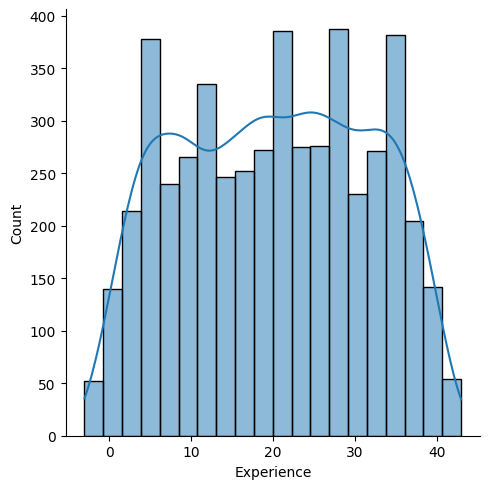

In [ ]:
# let us plot the distribution of the Experience variable and view the skeweness (if any) to decide on the best amputation approach
sns.displot(x=loan["Experience"], kde=True)

The data distribution is roughly taking the shape of a uniformly distributed curve. Accordingly, the approach to amputate the -ve values is by setting them equal to the median

In [ ]:
#applying numpy data attributed to experience column
loan["Experience"] = loan["Experience"].apply(
    lambda x: loan["Experience"].median() if x < 0 else x
)

In [ ]:
# checking the value counts to confirm amputation is successful
len(loan[loan["Experience"] < 0])

0

No more negative values in the variable Experience

***2. Zip code conversion***

Using the "uszipcode" library, we extract the "City" and "State" from the zipcode of every customer

In [ ]:
#import the searchengine from uszipcode library
import uszipcode
from uszipcode import SearchEngine

#create the search engine
search = SearchEngine()

#create a function to get the city from the zipcode
def get_city(x):
    return search.by_zipcode(x).city

#create a function to get the state from the zipcode
def get_state(x):
    return search.by_zipcode(x).state

Download /root/.uszipcode/simple_db.sqlite from https://github.com/MacHu-GWU/uszipcode-project/releases/download/1.0.1.db/simple_db.sqlite ...
  1.00 MB downloaded ...
  2.00 MB downloaded ...
  3.00 MB downloaded ...
  4.00 MB downloaded ...
  5.00 MB downloaded ...
  6.00 MB downloaded ...
  7.00 MB downloaded ...
  8.00 MB downloaded ...
  9.00 MB downloaded ...
  10.00 MB downloaded ...
  11.00 MB downloaded ...
  Complete!


In [ ]:
#create 2 empty lists to fill with city and state for each customer
the_city_ = []
the_state_=[]

#create a for loop to loop on the zipcodes, extract the city and state and fill the lists
for i in np.arange(0,5000):
    try:
        city = get_city(loan["ZIPCode"].iloc[i])
        the_city_.append(city)
        state = get_state(loan["ZIPCode"].iloc[i])
        the_state_.append(state)
    except:
        the_city_.append(np.nan)
        the_state_.append(np.nan)
    continue

In [ ]:
#Adding the city and state lists as new columns in the dataset
loan['City'] = the_city_
loan['State'] = the_state_
loan.head()

,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,City,State
0,25,1.0,49,91107,4,1.6,1,0,0,1,0,0,0,Pasadena,CA
1,45,19.0,34,90089,3,1.5,1,0,0,1,0,0,0,Los Angeles,CA
2,39,15.0,11,94720,1,1.0,1,0,0,0,0,0,0,Berkeley,CA
3,35,9.0,100,94112,1,2.7,2,0,0,0,0,0,0,San Francisco,CA
4,35,8.0,45,91330,4,1.0,2,0,0,0,0,0,1,Northridge,CA


In [ ]:
#explorying the null values added in the dataframe from the city and state lists
loan['City'].isnull().value_counts()

,count
City,
False,4966
True,34


In [ ]:
loan['State'].isnull().value_counts()

,count
State,
False,4966
True,34


34 values are missing

In [ ]:
#extracting the zipcodes that are returning the nan values
zip_nan = loan[loan['City'].isnull()]
zip_nan['ZIPCode'].value_counts()

,count
ZIPCode,
92717,22
96651,6
92634,5
93077,1


There are 4 unique Zip codes reflecting as NAN in the city column.

In [ ]:
# Checking the same for the state column
zip_nan_state = loan[loan['State'].isnull()]
zip_nan_state['ZIPCode'].value_counts()

,count
ZIPCode,
92717,22
96651,6
92634,5
93077,1


The missing city and state values share the same ZIP codes. I will manually lookup for the 4 unique codes on google and then replace the NAN with the actual value

In [ ]:
#Create a dictionary with the Zip code googled City and State
zip_dict = {'92717':'Irvine, CA',
             '96651':'Rudno nad Hronom, BC',
             '92634':'Fullerton, CA',
             '93077':'Ventura, CA'
            }

#Create a function to fill the missing values
def fill_nan(data, indxs, value, column):
    for i in indxs:
        data[column].iloc[i]=value

#Create a for loop to fill in the missing city and state values
for i in zip_dict.keys():
    indxs = loan[loan['ZIPCode']==int(i)].index
    fill_nan(loan, indxs, zip_dict[str(i)].split(',')[0], 'City')
    fill_nan(loan, indxs, zip_dict[str(i)].split(',')[1], 'State')

#confirm null values are removed in City and State columns
loan.isnull().sum()

,0
Age,0
Experience,0
Income,0
ZIPCode,0
Family,0
CCAvg,0
Education,0
Mortgage,0
Personal_Loan,0
Securities_Account,0


In [ ]:
#Display value counts of states
loan['State'].value_counts()

,count
State,
CA,4966
CA,28
BC,6


There are two main states CA (majority) and BC, yet "CA" and " CA" can be merged and " BC" to "BC" for a better homoginity

In [ ]:
loan['State'].replace(' CA','CA',inplace=True)
loan['State'].replace(' BC','BC',inplace=True)
loan['State'].value_counts()

,count
State,
CA,4994
BC,6


In [ ]:
#Display value counts of Cities
loan['City'].value_counts()

,count
City,
Los Angeles,375
San Diego,269
San Francisco,257
Berkeley,241
Sacramento,148
...,...
Sierra Madre,1
Ladera Ranch,1
Sausalito,1


There are 245 different cities in the dataset, most customers are from Los Angeles, San Diego, San Francisco, Berkeley and Sacramento

Finally, we drop the ZIP Code column

In [ ]:
loan.drop('ZIPCode', axis =1, inplace=True)

## Exploratory Data Analysis.

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. What is the distribution of mortgage attribute? Are there any noticeable patterns or outliers in the distribution?
2. How many customers have credit cards?
3. What are the attributes that have a strong correlation with the target attribute (personal loan)?
4. How does a customer's interest in purchasing a loan vary with their age?
5. How does a customer's interest in purchasing a loan vary with their education?

***1. Univariate analysis***

##i. Visualizing the numerical data

From the 5 point summary, it is observed that Age, Experience, Income, CCAvg and Mortgage are numerical and continous in nature, hence we will define and apply a function to plot the histogram & boxplot for each variable

In [ ]:
#we will define a function to plot the boxplot and histogram for all numerical variables
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

##Age

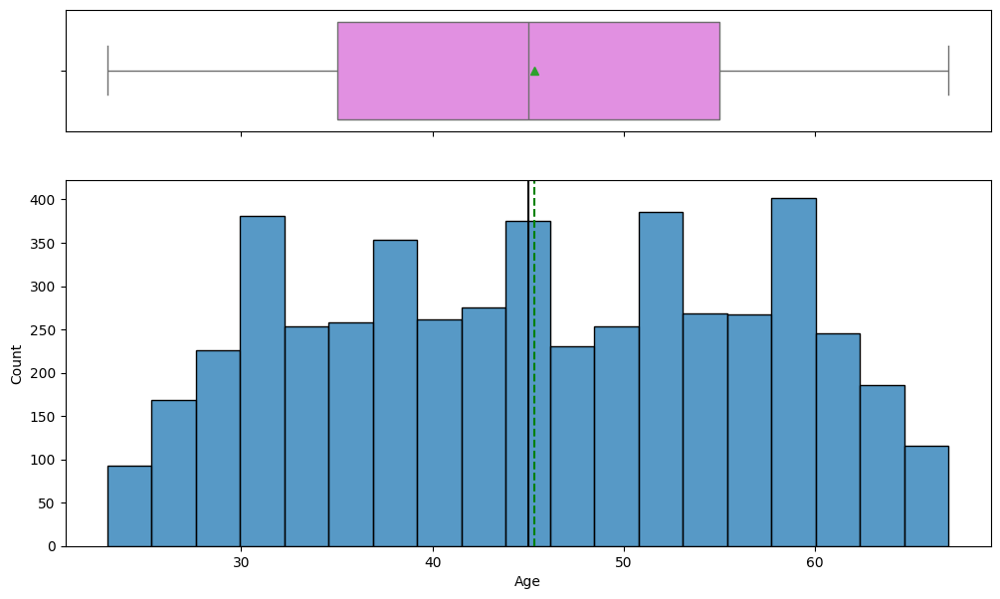

In [ ]:
histogram_boxplot(loan,'Age')

##This answer the question 4 in EDA section of the project
***Observations:***

1. The min of age is 23, while the max is 67. Average age is 45 Years old

2. The data looks slightly fit as a uniform distribution.

2. The maximum number of clients is within the 58-60 years old range, there are also peak counts at 30-32, 38-40, 44-46 and 52-54 years old

3. There are no outliers observed.

##Experience

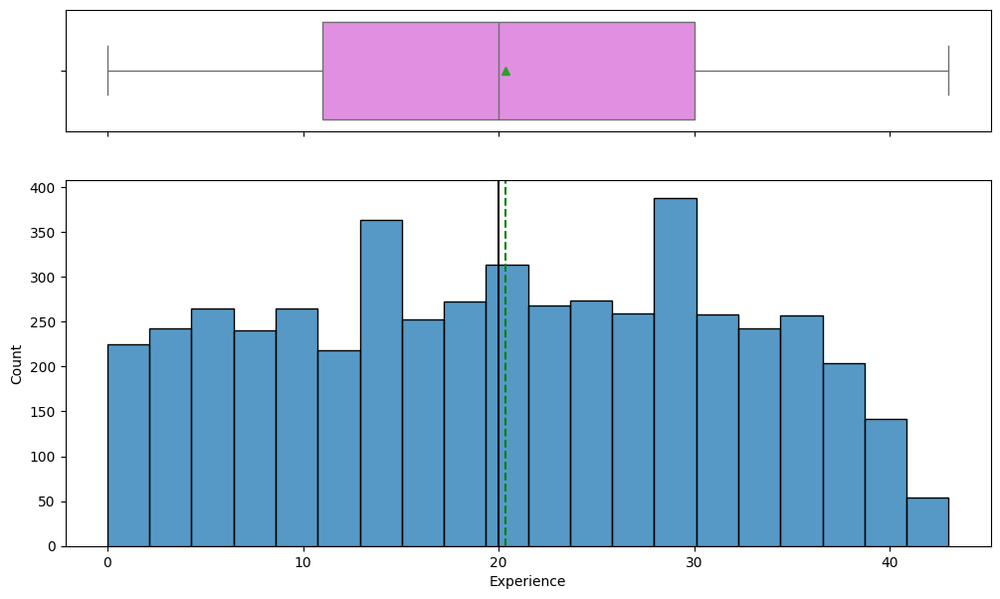

In [ ]:
histogram_boxplot(loan,'Experience')

***Observation***

1. The min Experience is 0 year, while the max is 43 years and the mean is approximatly 20 years.

2. The data is almost fitting as a uniform distribution with peaks at 12-14 years and 28-30 years

3. There are no outliers observed

##Income

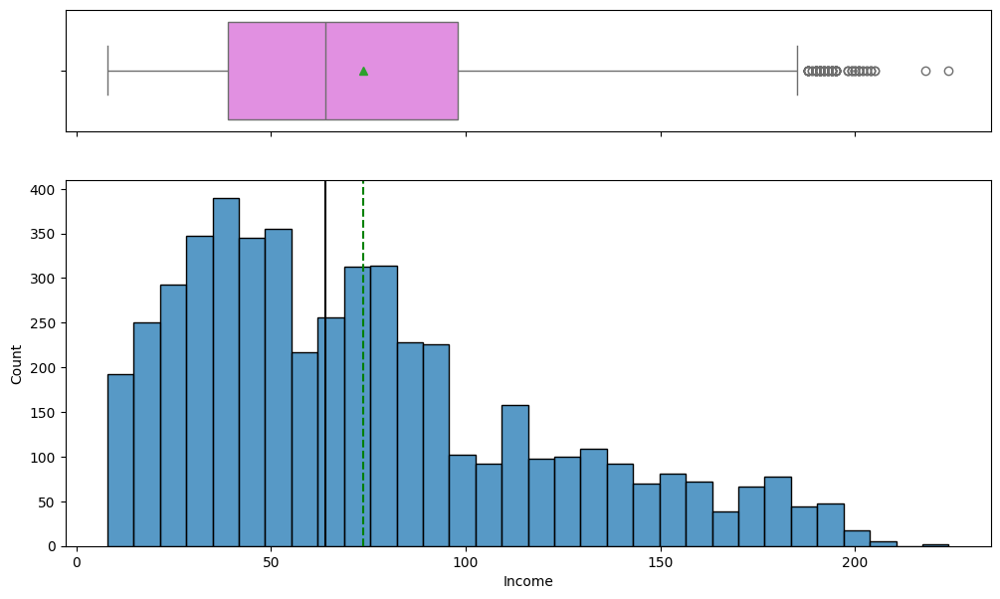

In [ ]:
histogram_boxplot(loan,'Income')

***Observation***

1. The min Income is USD46000, while the max income is USD224000 and average is USD64000

2. Dataset is rightly skewed

3. There is a notifiabe number of outliers, but it seem consistent with the provided data

4. No action may be required for the outlier treatment

##CCAvg - Credit Card Avg

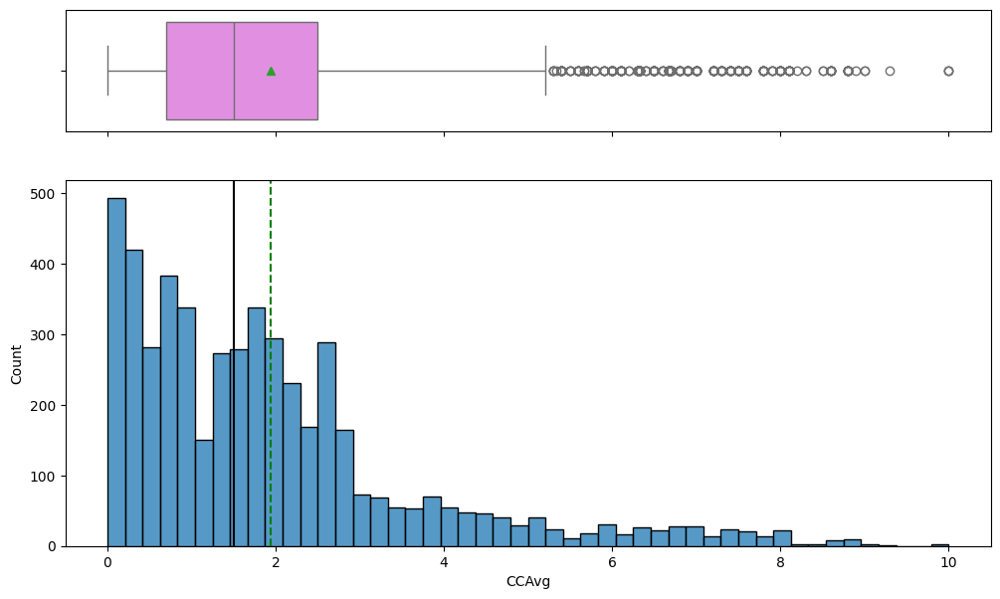

In [ ]:
histogram_boxplot(loan,'CCAvg')

***Observation***

1. The min CCAvg is USD 0

2. This may reflect customers who do not to have credit cards)

3. The max CCAvg is USD1900 and average is approx USD 1900

4. Dataset is skewed to the right with a number of outliers that is homogenous with the provided data

5. No action is recommended to the outliers

##Mortgage

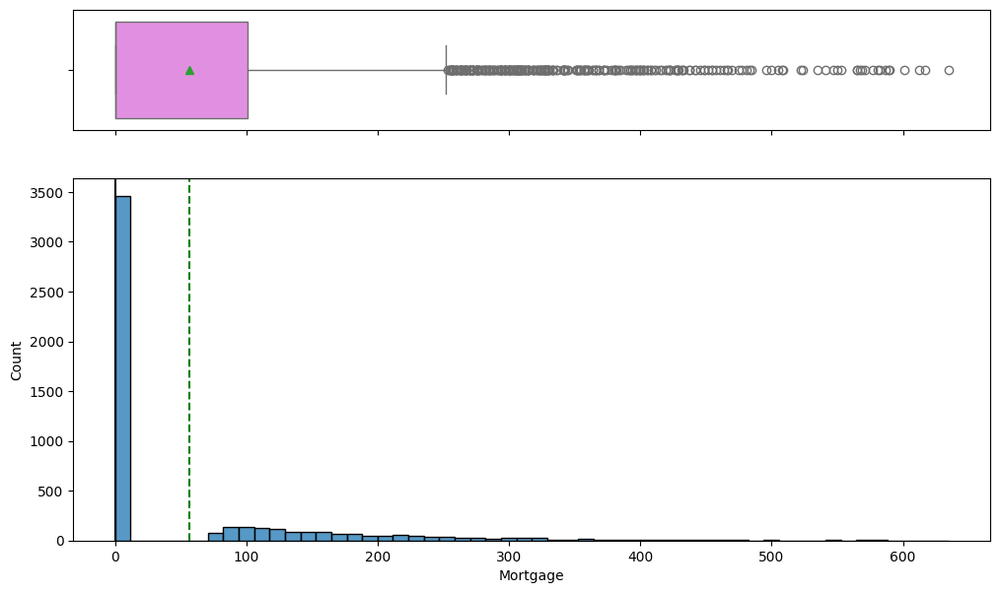

In [ ]:
histogram_boxplot(loan,'Mortgage')

***Observation***

1. The min Mortgage is USD 0, while the max is USD635000 and average is USD 0

2. Dataset heavily skewed to the right

3. It would be better to separate the USD 0 mortgage from the >USD0 mortgage values in order to be abke to visualize it better and to plot the data again

In [ ]:
#extracting the customers with mortgage values > 0
mortgage = loan[loan['Mortgage']>0]
print(f'There are {len(mortgage)} customers under mortgage and forms {round((len(mortgage)/5000)*100)}% of the dataset')

There are 1538 customers under mortgage and forms 31% of the dataset


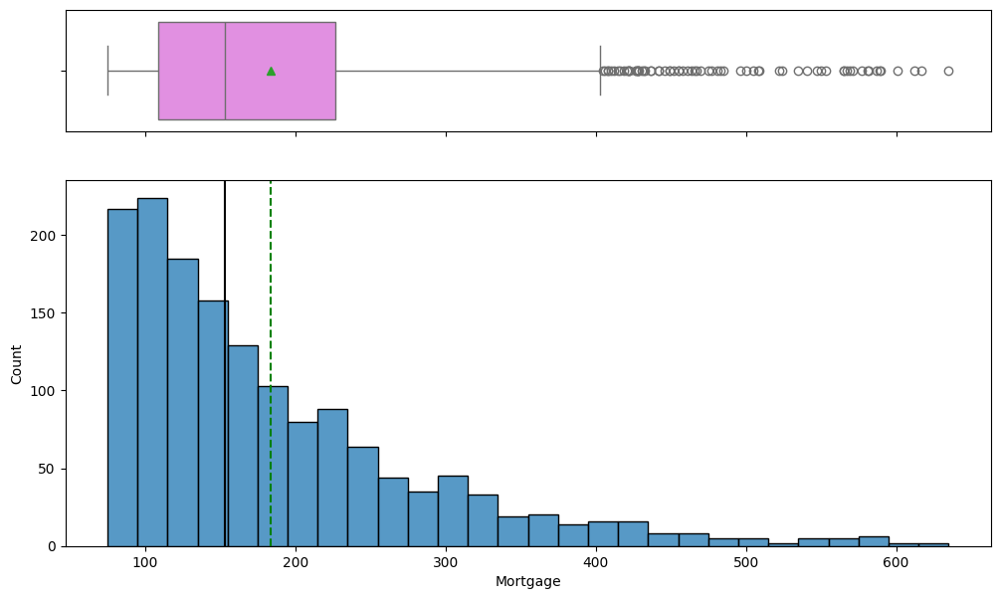

In [ ]:
#plotting mortgage of the customers again
histogram_boxplot(mortgage,'Mortgage')

##This answer the question 1 in EDA section of the project
***Observation***

The mortgage distibution of the customers under mortgage is skewed to the right with a minimum value of approx 99000 and to max value of 635000 and mean value between USD 180000 to 200000. Better than the previous visualization.

##ii. Visualizing the categorical data

From the 5 point summary, it is observed that Zip codes, Family size, Education, Personal_Loan, CD_Account, Online and CreditCard are categorical in nature, hence we will define and apply a function to plot a labelled barplot for each variable

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

##Cities Zip Codes

<Axes: xlabel='count', ylabel='City'>

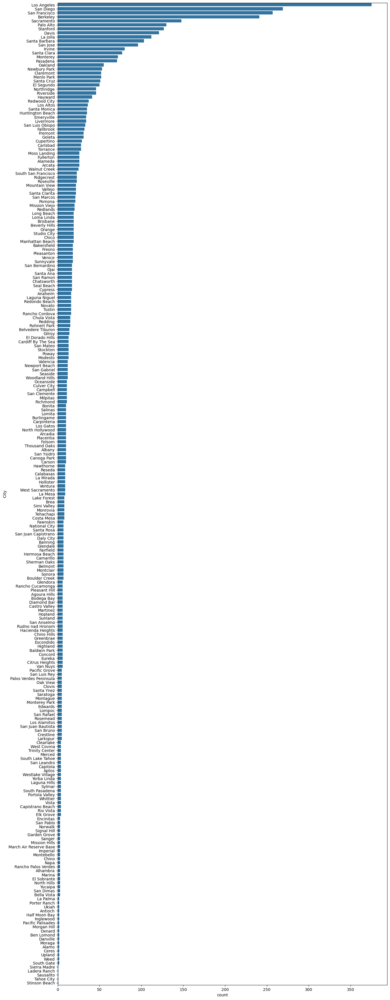

In [ ]:
plt.figure(figsize=(15,45))
sns.countplot(data=loan, y='City', order=loan['City'].value_counts().index)

***Observation***

1. Approx. 25.8% of the customers in the dataset are residing in Los Angeles, San Diego, San Fransisco, Berkeley and Sacramento (these are the top 5 cities in the dataset)

2. The top city is Los Angeles where 7.5% of the customers resides

3. Overview of the city

City	       |No. of customers|
1. Los Angeles    | 375|
2. San Diego      | 269|
3. San Francisco  | 257|
4. Berkeley       | 241|
5. Sacramento     | 148|

##Family size

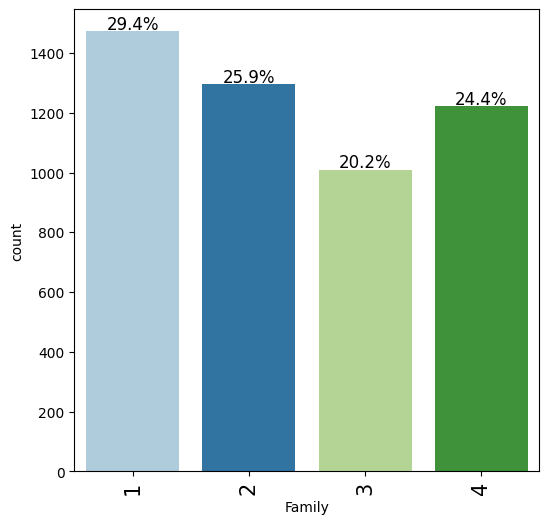

In [ ]:
labeled_barplot(loan,'Family',perc=True)

***Observation***

1. The majority of Family sizes (29.4%) is size 1

2. Followed by (25.9%) of size 2

3. The 3rd family size is Size 4 which is (24.4%)

4. Finally, family size 3 have (20.2%) in the dataset

##Education

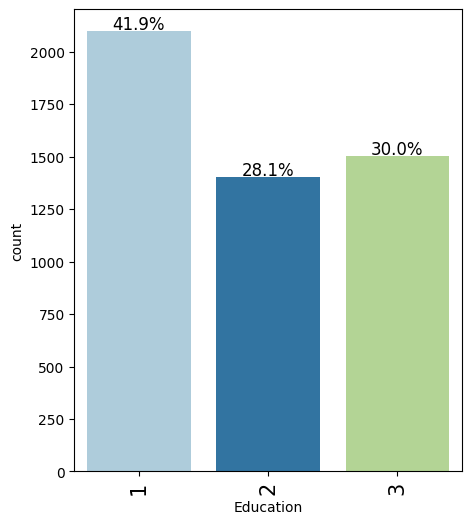

In [ ]:
labeled_barplot(loan,'Education',perc=True)

##This answer the question 5 in EDA section of the project
***Observation***

1. 41.9% of customers are 1: Undergrad

2. 28.1% of customers are 2: Graduate

3. 30.0% of customers are 3: Advanced/Professional

##Personal Loan

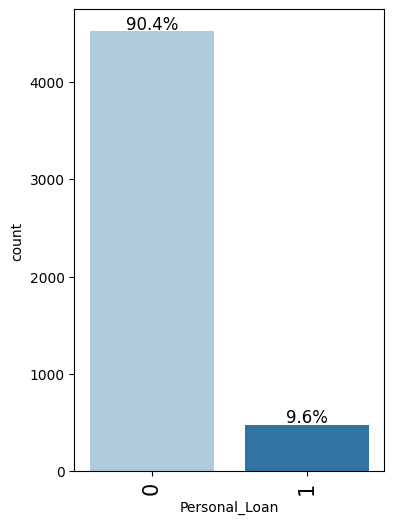

In [ ]:
labeled_barplot(loan,'Personal_Loan',perc=True)

##This answer the question 3 in EDA section of the project
***Observation***

1. 90.4% of customers Did not accept a loan

2. 9.6% of customers accepted a loan

3. This need more work to find out the difference of the 0.6% mismatch

##CD_Account

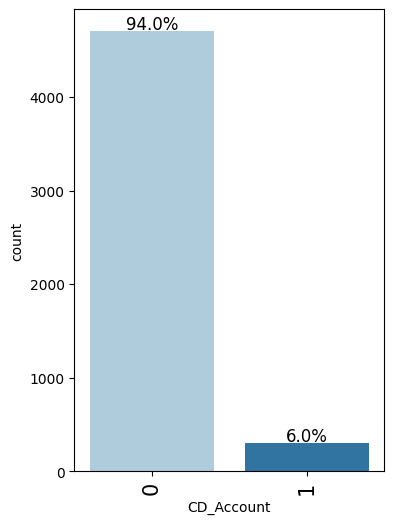

In [ ]:
labeled_barplot(loan,'CD_Account',perc=True)

***Observation***

1. 94% of customers Do Not have a CD_Account

2. 6% only have a CD_Account

##Online

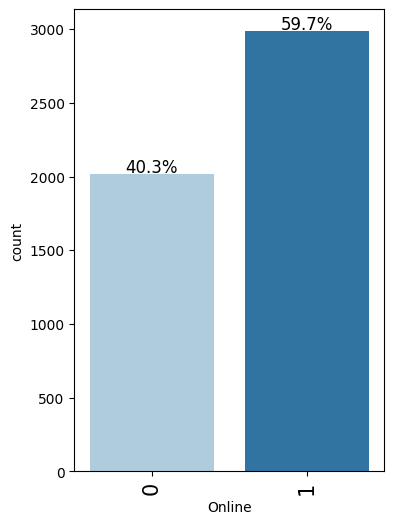

In [ ]:
labeled_barplot(loan,'Online',perc=True)

***Observation***

1. 59.7% of customers use the online banking services

2. 40.3% of customers do not use the online banking services

##CreditCard

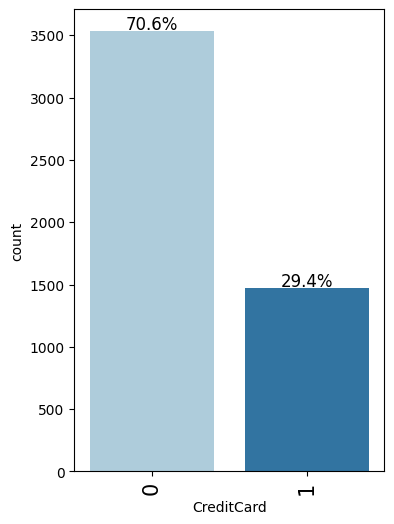

In [ ]:
labeled_barplot(loan,'CreditCard',perc=True)

##This answer the question 2 in EDA section of the project
***Observation***

1. 70.6% of customers do not use a credit card issued by a different bank

2. 29.4% of customers use a credit card issued by a different bank

***2. Bivariate analysis***

*I will like to start with a simple pair plot in order to view if any correlation between the data set variables will occur*

<Figure size 1500x700 with 0 Axes>

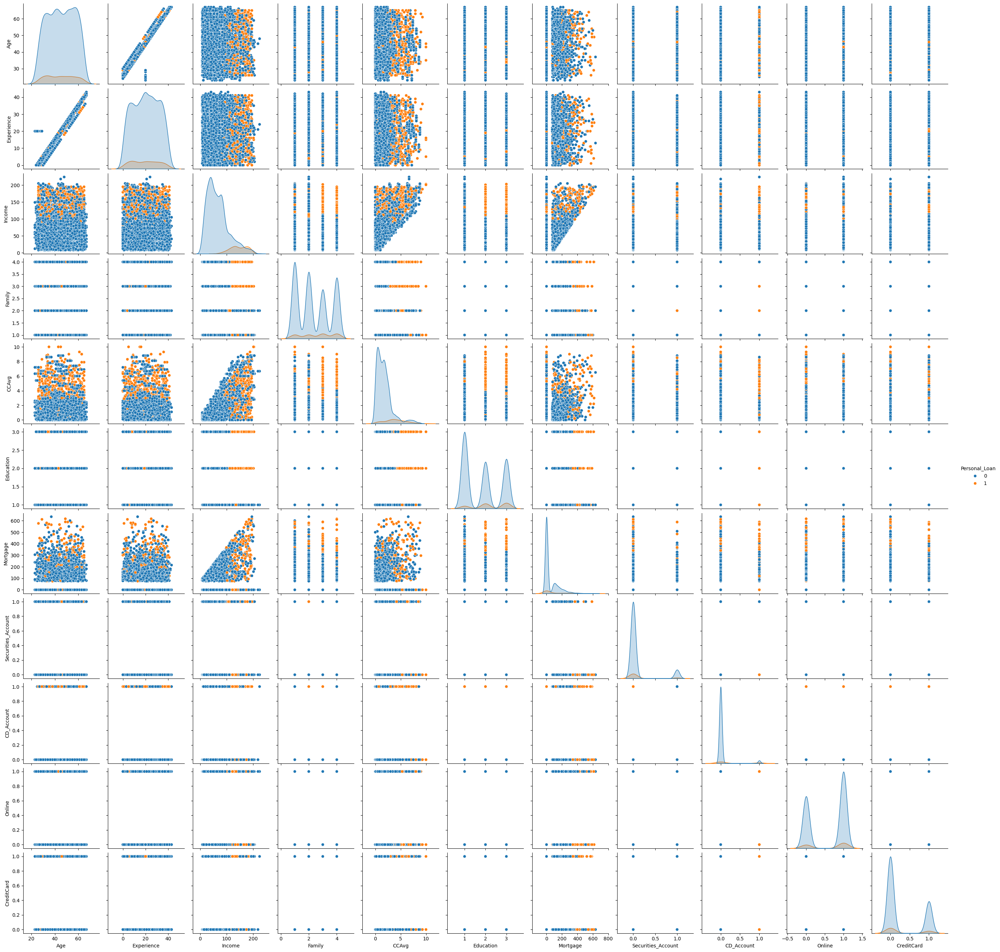

In [ ]:
plt.figure(figsize=(15,7))
# sns.pairplot(loan, diag_kind='kde')
sns.pairplot(loan, hue="Personal_Loan")
plt.show()

***Observations:***

The orange spots in the plot represent the customers who accepted a personal loan and the blue spots show the ones who did not.

a. From the univariate analysis of the personal loan dataset done above, it was observed that only 9.6% of the customers accepted the personal loan, hence this observation is consistent with the pair plot where the majority of the spots are blue

b. It is observed that there is a very strong linear corelation between Age and Experience in the dataset

c. It is also observed that there is slight correlation between Income and CCAvg as shown in the pair plot above

d. High concentraion of customers who accepted a personal loan are observed at the following points in the dataset:
   1. Higher Income level (starting at approx USD100000 and above)
   2. Higher CCAvg (starting at approx USD3000 and above)
   3. Higher Mortgage value (starting at approx USD300000 and above)
   4. Customers with CD_Accounts in the dataset
   5. Customers who use credict cards issued from other banks other than the bank under review
   6. Famillies with sizes 3 and 4
   7. Customers with Eductaion 2-graduate and 3-advanced/professional
   
I think an idea of what to expect in the above variables which have from medium to high prediction power on the classification models is very essential.

<Axes: >

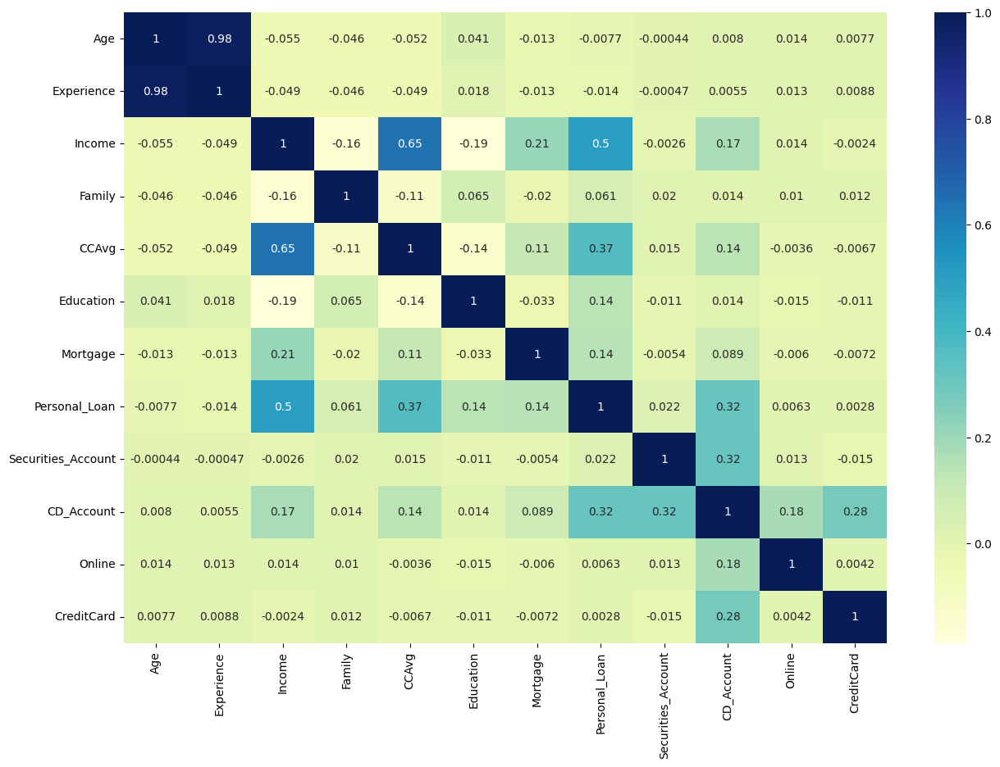

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(loan.select_dtypes(include=np.number).corr(),annot=True,cmap='YlGnBu')

***Observation***

The following heatmap observation above is not very different from what has been seen in the pairplot above, which are;

1. The correlation between Age and Experience is very high (0.98)

2. The correlation between Income and CCAvg is lower (0.65)

3. All other correlation values are quite small for our further consideration

4. Income and mortgage is also positively correlated but not very high, its below 25% of correllation.

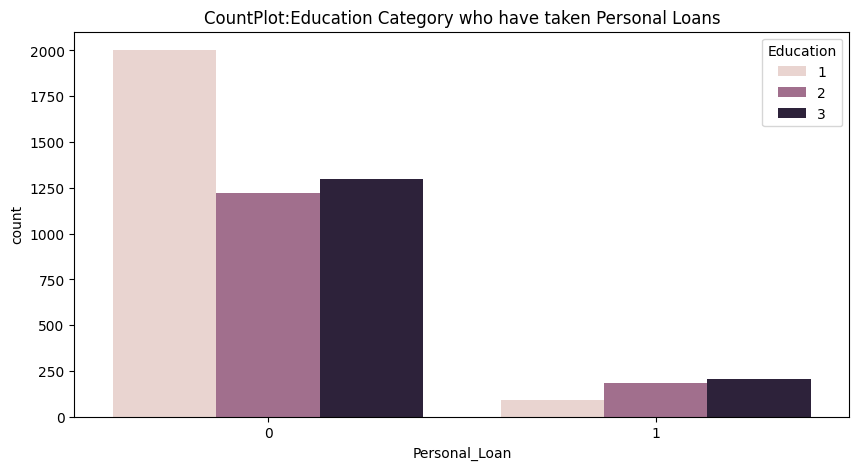

In [ ]:
# Write the code here
plt.figure(figsize=(10,5))
plt.title('CountPlot:Education Category who have taken Personal Loans')
sns.countplot(loan, x="Personal_Loan", hue='Education')
plt.show()

***Observation***

The following heatmap observation above is not very different from what has been seen in the pairplot above, which are;

1. The correlation between Personal loan and Education is inverse, the higher the education of customers the lower the willingness to take personal loan

2. People with higher education tend not to take personal loans

In [ ]:
import plotly.express as px
Figure_3D=px.scatter_3d(loan,x='Personal_Loan', y='Age',z='Income',color='Age');
Figure_3D.show()

In [ ]:
Figure_3D.write_html('/content/drive/My Drive/Addedum image to project.html')

***Observation***

The above plotly image is a 3-D immage which tend to explain the correlation between age, income and the ability or willingness of custimers to accept personal loan

***NB: To see this 3-D image, please see the Addendum 1 uploaded as a separate html file.***


#Observing effect of the variables on our target variable (Personal loan)

##a. Plotting the target Vs distribution of numerical variables

Let us plot the target Vs distribution of the variables to understand further our data set prior building the model

In [ ]:
### function to plot distributions wrt our target variables


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(10, 7))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of Target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of Target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t Target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t Target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

In [ ]:
#checking the columns heads in the dataframe
loan.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Personal_Loan', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard', 'City', 'State'],
      dtype='object')

##Age Vs Personal Loan

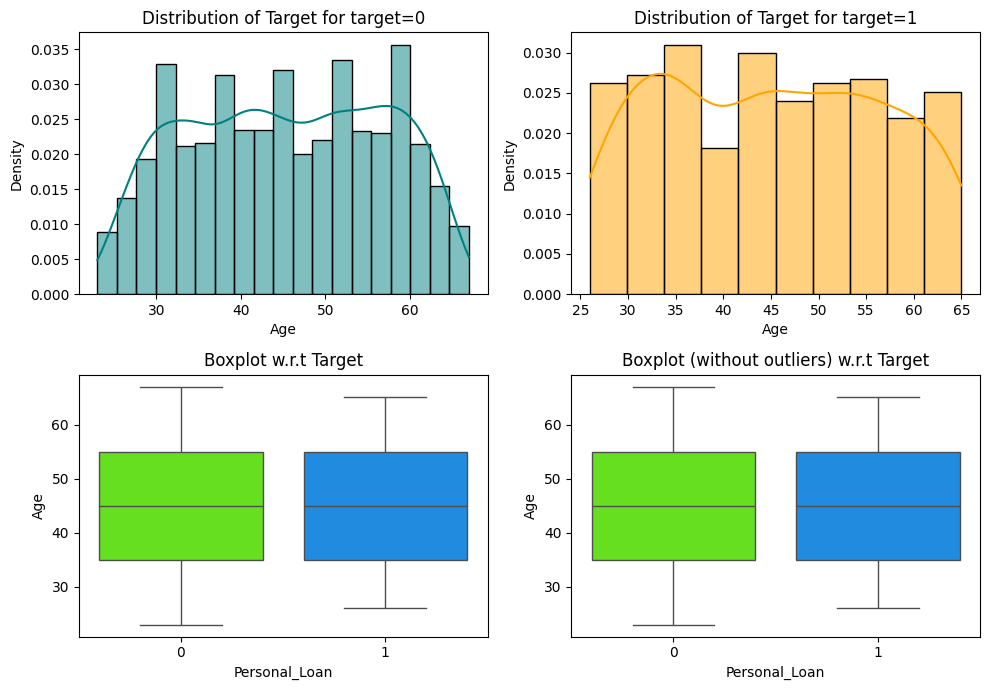

In [ ]:
distribution_plot_wrt_target(loan,'Age','Personal_Loan')

***Observation***

1.  The mean age for customers accepting or not accepting personal loans is very close to the value 45 years of age.

2.  As seen from the pair plot Age, it does not have relation with our target variable, so it has a small prediction power

##Experience Vs Personal Loan

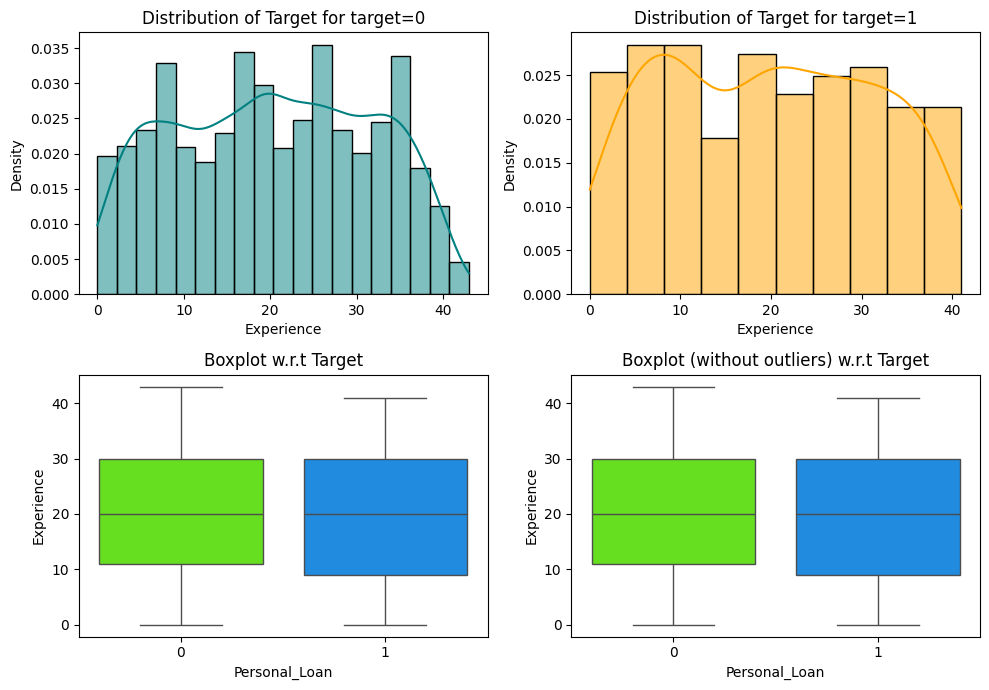

In [ ]:
distribution_plot_wrt_target(loan,'Experience','Personal_Loan')

***Observation***

1. The mean Experience for customers accepting or not accepting personal loans is very close to the value 20 years of experience

2. As observed in the pair plot, Experience does not have relation with our target variable, so it has a small prediction power

##Income Vs Personal Loan

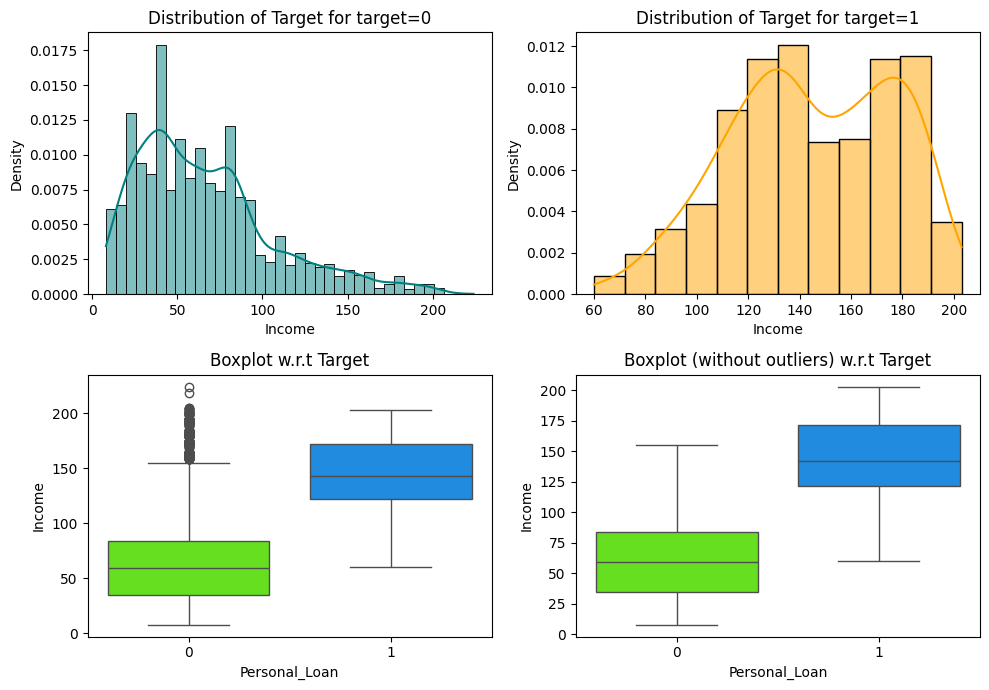

In [ ]:
distribution_plot_wrt_target(loan,'Income','Personal_Loan')

***Observations:***

1. As I observed before, the Income variable varies greatly between customers who accepted and who does not accept personal loans.

2. The mean income for the customers ***who did not accept*** the loan is approx USD65000

3. While the mean income for the customers ***who accepted*** the loan is approx USD145000

4. Therefore, the income level of the customers has high impact on the customer's decision to take personal loan

5. The higher the income, the more chances the customer will accept a personal loan

##Mortgage Vs Personal Loan

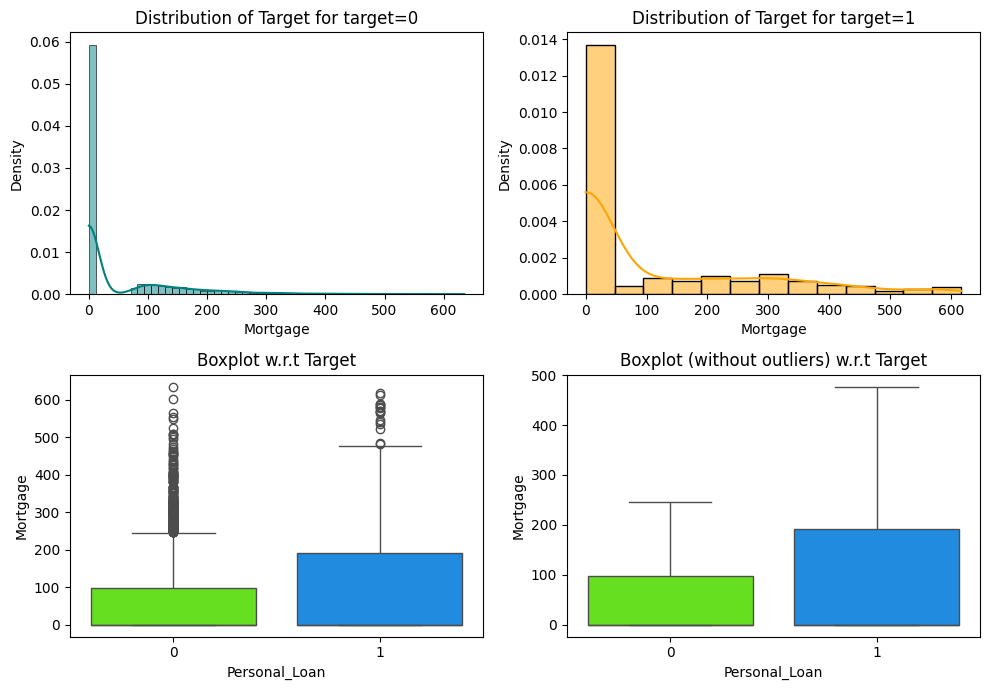

In [ ]:
distribution_plot_wrt_target(loan,'Mortgage','Personal_Loan')

***Observation***

1. Customers paying mortgage are more likely to accept personal loan

2. Variable distribution is heavily right skewed due to the high number of customers not paying mortgage

3. In view of the above point (2), its inevitable to plot the distribution of customers paying mortgage only which are shown in the dataframe

4. This should provide clearer and more in-depth insight into the mortgage mean value for ***customers accepting*** and those ***custmers who does not accept*** a personal loan.

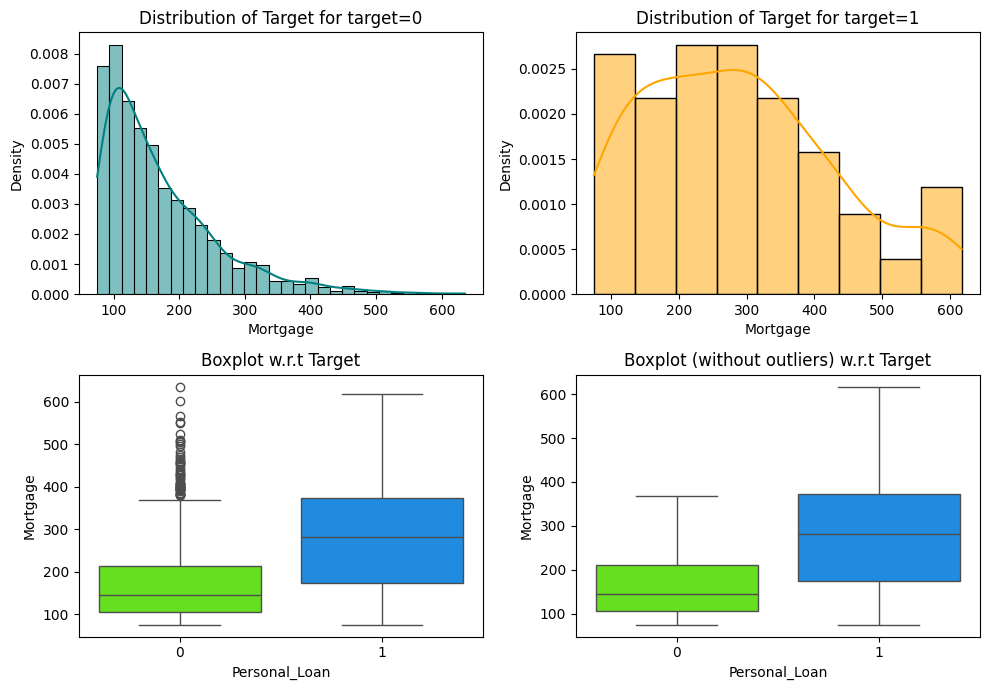

In [ ]:
#distribution of customers paying mortgage only
distribution_plot_wrt_target(mortgage,'Mortgage','Personal_Loan')

***Observation***

1. The mean value of mortgage paid by customers not accepting a personal loan is approx USD150000 USD which is much less than the mean value of customers accepting personal loan of approx USD290000

2. As its shown now, the higher the mortgage value increase, the more likely it is for a customer to accept a personal loan.

##CCAvg Vs Personal Loan

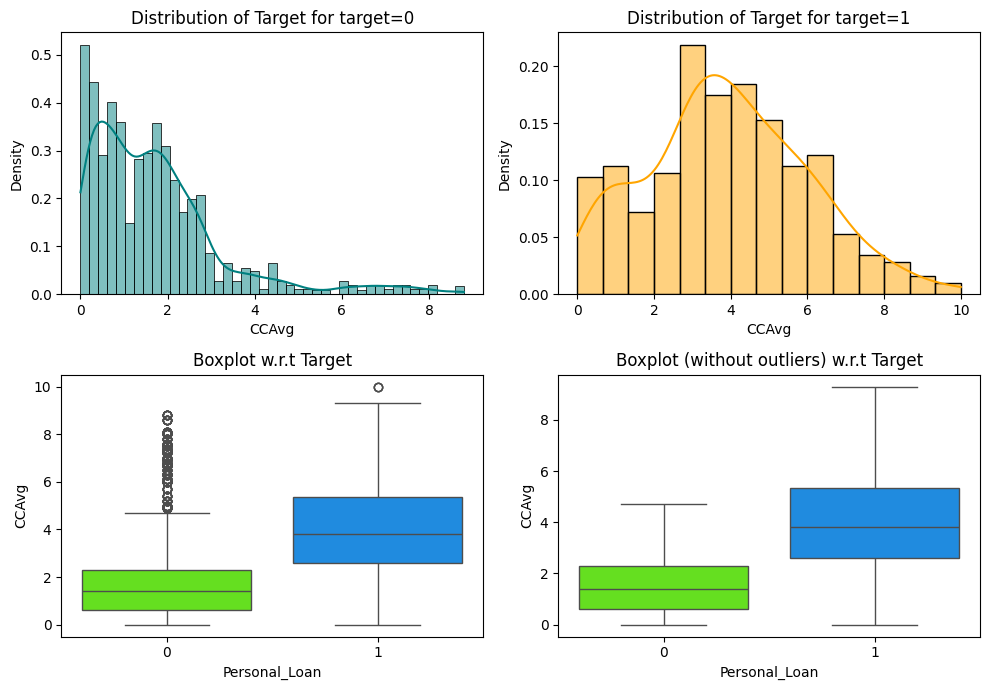

In [ ]:
distribution_plot_wrt_target(loan,'CCAvg','Personal_Loan')

***Observation**

1. The mean value of CCAvg of customers not accepting a personal loan is approx USD 1600 which is much less than the mean value of customers accepting personal loan of approx USD4000.

2. Customers who accept personal loan spends more money on a monthly basis

#b. Plotting distribution of categorical variables Vs Target variable (Personal Loan)

In [ ]:
# function to plot stacked bar chart


def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 6))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

##Family Vs Personal Loan

Personal_Loan     0    1   All
Family                        
All            4520  480  5000
4              1088  134  1222
3               877  133  1010
1              1365  107  1472
2              1190  106  1296
------------------------------------------------------------------------------------------------------------------------


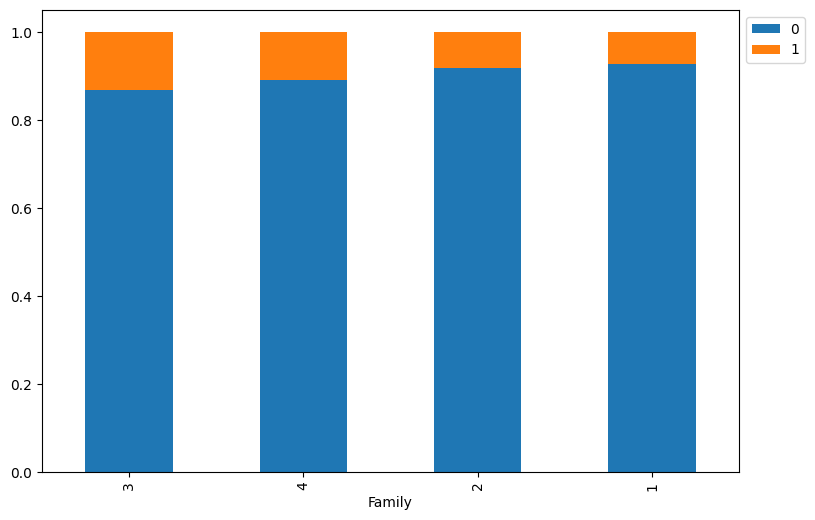

In [ ]:
stacked_barplot(loan,'Family','Personal_Loan')

***Observation***

1. Famillies of size 3 or 4 have more propensity to accept a personal loan

2. Hence, we can conclude that as the familly size grows, customers would be more willing to accept personal loans

##Education Vs Personal Loan

Personal_Loan     0    1   All
Education                     
All            4520  480  5000
3              1296  205  1501
2              1221  182  1403
1              2003   93  2096
------------------------------------------------------------------------------------------------------------------------


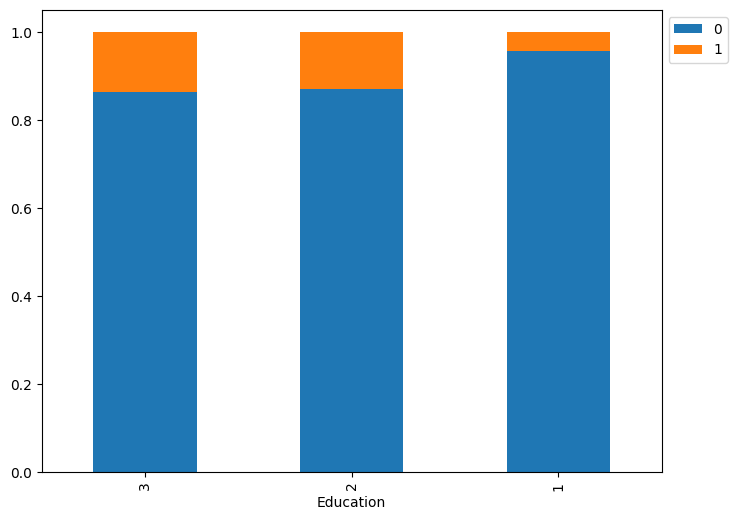

In [ ]:
stacked_barplot(loan,'Education','Personal_Loan')

***Observation***

1. Customers with education levels 2 and 3 are more willing to accept a personal loan than customers with education level 1

2. The highest being customers with education level 3

##Securities Account Vs Personal Loan

Personal_Loan          0    1   All
Securities_Account                 
All                 4520  480  5000
0                   4058  420  4478
1                    462   60   522
------------------------------------------------------------------------------------------------------------------------


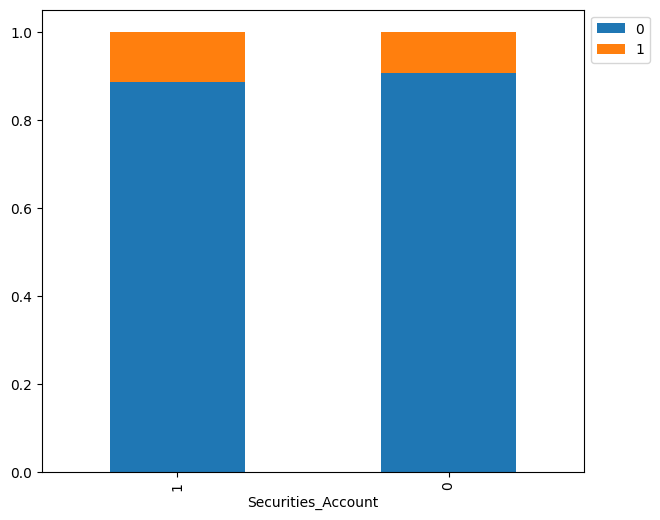

In [ ]:
stacked_barplot(loan,'Securities_Account','Personal_Loan')

***Observation***

1. Customers with Security account are more willing to accept a personal loan

##CD_Account Vs Personal Loan

Personal_Loan     0    1   All
CD_Account                    
All            4520  480  5000
0              4358  340  4698
1               162  140   302
------------------------------------------------------------------------------------------------------------------------


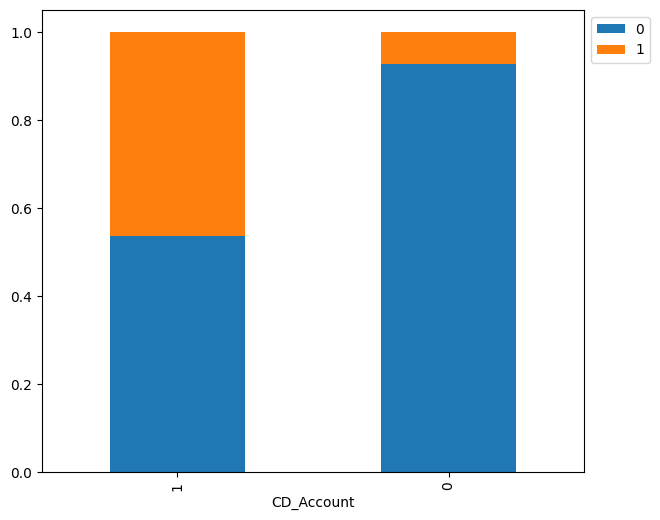

In [ ]:
stacked_barplot(loan,'CD_Account','Personal_Loan')

***Observation***

1. Customers with CD_account are more willing to accept a personal loan

##Online Vs Personal Loan

Personal_Loan     0    1   All
Online                        
All            4520  480  5000
1              2693  291  2984
0              1827  189  2016
------------------------------------------------------------------------------------------------------------------------


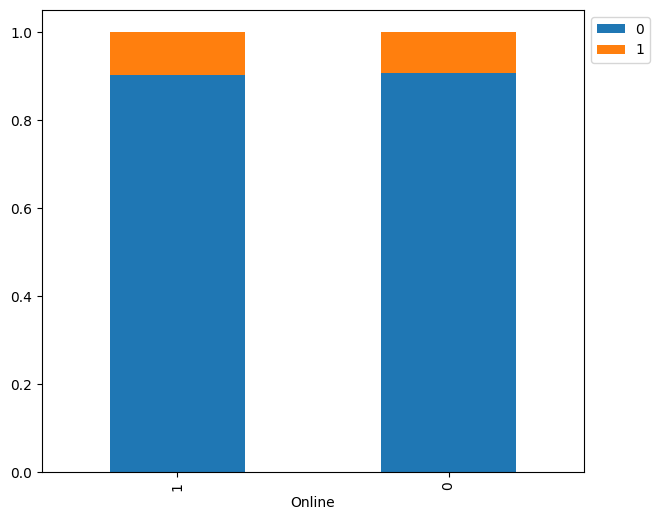

In [ ]:
stacked_barplot(loan,'Online','Personal_Loan')

***Observation***

1. Customers who use iternet banking services and who doesn't are are not different from each other.

2. The possibility of accepting personal loans or not accepting it is almost likely the same as its shown in the plot above.

##CreditCard Vs Personal Loan

Personal_Loan     0    1   All
CreditCard                    
All            4520  480  5000
0              3193  337  3530
1              1327  143  1470
------------------------------------------------------------------------------------------------------------------------


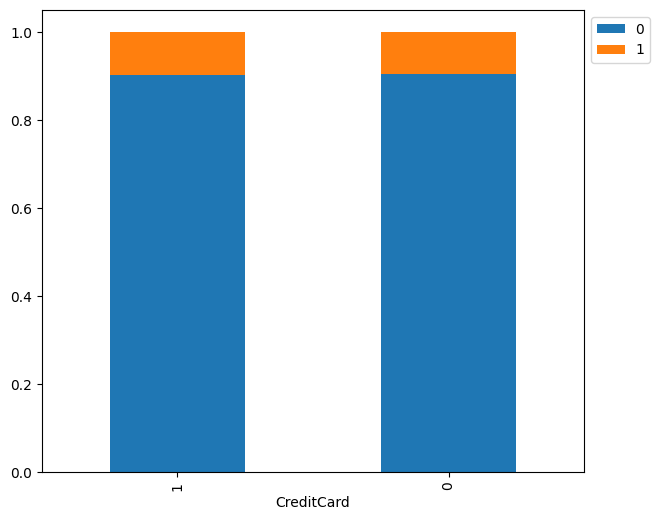

In [ ]:
stacked_barplot(loan,'CreditCard','Personal_Loan')

***Observation***

1. Customers who use credit cards issued by other banks and those who does not are almost equally likely to accept personal loans

##City Vs Personal Loan

For a better visualization, I will assign a threshold in order to be able to pick the most common cities between the customers and and to assign the remaining to others.

The resultant dataframe created will be used to visualize how most common cities would vary with the target - personal loan.

In [ ]:
#assigning the threshold of 50
cities = loan['City'].value_counts()
threshold = 50
cities[cities.values >= threshold]

,count
City,
Los Angeles,375
San Diego,269
San Francisco,257
Berkeley,241
Sacramento,148
Palo Alto,130
Stanford,127
Davis,121
La Jolla,112


In [ ]:
#the threshhold of 50 looks appropriate, so lets extract the names of the cities
cities_list = cities[cities.values >= threshold].index.tolist()
print("Cities names taken into consideration:\n", len(cities_list))
print(cities_list)

Cities names taken into consideration:
 21
['Los Angeles', 'San Diego', 'San Francisco', 'Berkeley', 'Sacramento', 'Palo Alto', 'Stanford', 'Davis', 'La Jolla', 'Santa Barbara', 'San Jose', 'Irvine', 'Santa Clara', 'Monterey', 'Pasadena', 'Oakland', 'Newbury Park', 'Claremont', 'Menlo Park', 'Santa Cruz', 'El Segundo']


In [ ]:
#we create a copy of the created data frame as we are doing this transformation only for better visualization
loan_t = loan.copy()

In [ ]:
loan_t['City'] = loan_t['City'].apply(lambda x:x if x in cities_list else 'others')

In [ ]:
#function to plot horizontal stacked bar chart
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="barh", stacked=True, figsize=(count + 5, 9))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

Personal_Loan     0    1   All
City                          
All            4520  480  5000
others         2181  227  2408
Los Angeles     337   38   375
Berkeley        214   27   241
San Diego       248   21   269
San Francisco   238   19   257
Palo Alto       114   16   130
La Jolla         97   15   112
Stanford        114   13   127
Sacramento      135   13   148
Santa Clara      65   12    77
San Jose         85   11    96
Irvine           69   11    80
Pasadena         61   10    71
Santa Barbara    95    8   103
Santa Cruz       44    7    51
Monterey         66    6    72
Davis           115    6   121
El Segundo       45    5    50
Oakland          50    5    55
Claremont        48    4    52
Menlo Park       48    4    52
Newbury Park     51    2    53
------------------------------------------------------------------------------------------------------------------------


<Figure size 1000x4000 with 0 Axes>

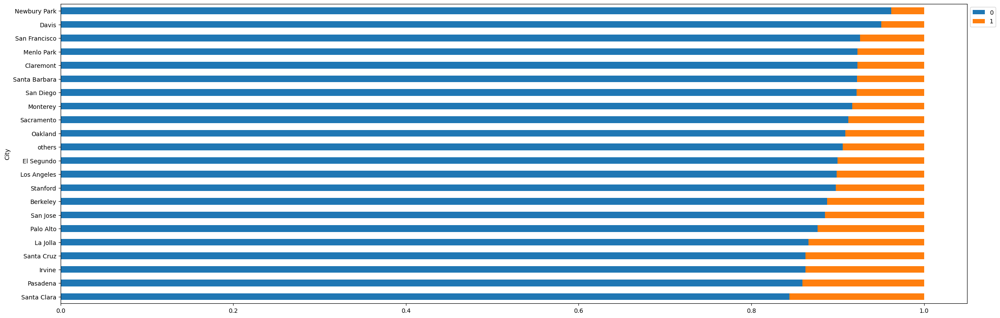

In [ ]:
#plotting a horizonal stacked bar plot of the transformed dataset
plt.figure(figsize=(10,40))
stacked_barplot(loan_t,'City','Personal_Loan')

***Observation***

1. Santa Clara shows the greatest ratio of customers willing to accept personal loans

2. Pasadena is the second city that show greater ration of customers who are willing to accept personal loans

3. Irvine is the third city that shows great ratio of customers willing to accept personal loans

##State Vs Personal_Loan

Personal_Loan     0    1   All
State                         
CA             4514  480  4994
All            4520  480  5000
BC                6    0     6
------------------------------------------------------------------------------------------------------------------------


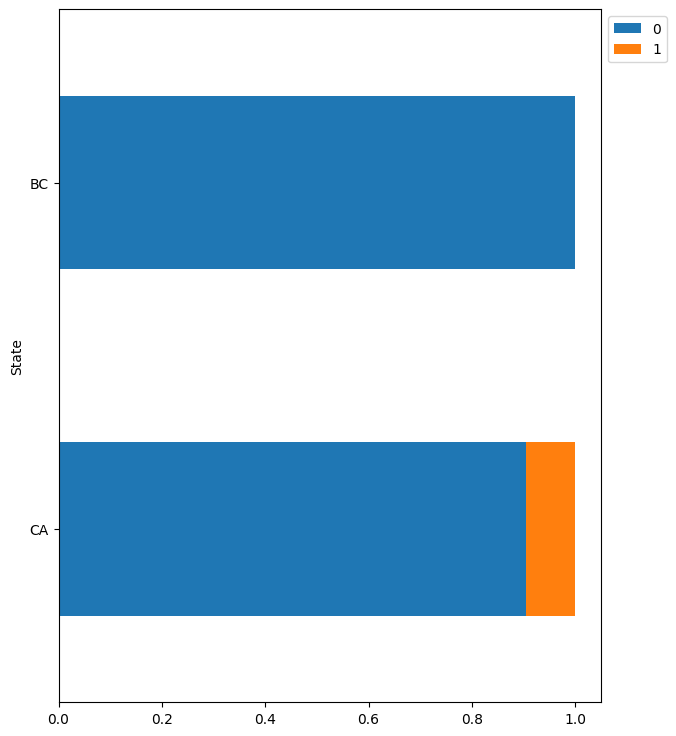

In [ ]:
stacked_barplot(loan,'State','Personal_Loan')

***Observations***

1. Customers living in the State of California USA are more willing to accept personal loans than the customers in British Columbia Canada

#Key Insights based on EDA

The Five point summary for all the variables including the city and state added columns:

In [ ]:
loan.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Age,5000.0,NaN,NaN,NaN,45.3384,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,NaN,NaN,NaN,20.3276,11.253035,0.0,11.0,20.0,30.0,43.0
Income,5000.0,NaN,NaN,NaN,73.7742,46.033729,8.0,39.0,64.0,98.0,224.0
Family,5000.0,NaN,NaN,NaN,2.3964,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,NaN,NaN,NaN,1.937938,1.747659,0.0,0.7,1.5,2.5,10.0
Education,5000.0,NaN,NaN,NaN,1.881,0.839869,1.0,1.0,2.0,3.0,3.0
Mortgage,5000.0,NaN,NaN,NaN,56.4988,101.713802,0.0,0.0,0.0,101.0,635.0
Personal_Loan,5000.0,NaN,NaN,NaN,0.096,0.294621,0.0,0.0,0.0,0.0,1.0
Securities_Account,5000.0,NaN,NaN,NaN,0.1044,0.305809,0.0,0.0,0.0,0.0,1.0
CD_Account,5000.0,NaN,NaN,NaN,0.0604,0.23825,0.0,0.0,0.0,0.0,1.0


***EDA Final Observations;***

***Key observations on the univariate analysis:***

1. The min Age is 23 ,max is 67, Average is 45 Years old

2. Data seems is slightly fitting a uniform distribution.

3. The min Experience is 0 years, the max is 43 years and the mean is approx. 20 years.

4. The min CCAvg is USD0 (reflecting customers who do not own credit cards), max is USD1900 and average is USD10000

5. 69% of the customers are not paying mortage and the remainig 31% paying min value of approx USD99000 to max value of USD635000 and mean value between USD180000-200000 for mortgage

6. The top 5 cities are Los Angeles (1st),San Diego (2nd), San Fransisco (3rd), Berkeley (4th) and Sacramento (5th)

7. The top State is CA

8. The majority of Family sizes (29.4%) is size 1, followed by (25.9%) of family size 2 then (24.4%) of size family size 4 and finally (20.2%) of family size 3.

9. Customer Education is distributed as follow:
41.9% of customers are 1: Undergrad
28.1% of customers are 2: Graduate
30.0% of customers are 3: Advanced/Professional

10. 94% of customers Do Not have a CD_Account and 6% only have a CD_Account

11. 40.3% of customers do not use the online banking services and 59.7% have Online banking services

12. 70.6% of customers do not hold a credit card and 29.4% of customers hold credit cards

13. The target variable Personal_Loan shows 90.4% of customers Did not accept a loan and 9.6% of customers accepted a loan

***Key Insights and Observations on the multivariate analysis:***

*Correlation between variables*

1. The correlation between Age and Experience is very high (value = 0.98)

2. The correlation between Income and CCAvg is lower (value = 0.65)

3. All other correlation values are quiet small for consideration

*The effect of variables on the target variable*

***(Variable)***	*(Effect on Target Variable - Personal Loans)*

***Income***	The higher the income, the more chances the customer will accept a personal loan

***CCAvg***	    The higher the monthly spending of customers increase, the more likely they are willing to accept personal loan

***Education***	The higher the Education level of the customers, the more willing they are to accept a personal loan

***Mortgage***	The higher the value of mortgage, the higher the customer is more likely to accept a personal loan

***City***	    Santa Clara shows the greatest ratio of customers willing to accept personal loans, then Pasadena and lastly, Irviner.

***State*** 	The customers residing in CA are more willing to accept personal loans

***Securities_Acc***	Customers with a Security account are more willing to accept a personal loan

***CD_Account***    	Customers with CD_account are more willing to accept a personal loan

***Online***	      No effect on the target variable is being observed on the target variable (Personal loan)

***Age***  	          No effect on the target variable is being observed on the target variable (Personal loan)

***Experience***      No effect on the target variable is being observed on the target variable (Personal loan)

***CreditCard***	  No effect on the target variable is being observed on the target variable (Personal loan)

***Expected target dependencies***

From Higher to high importance is being expected for these variables: ***Income, Familly, CCAvg, Education, Mortgage, Security Account and CD_Account***

Low importance is expected for these variables: ***Age, Experience, Credit card and Online***

## Model Building

##Data Preparation for modelling

Previously applied Data Pre-proccesing actions:

1. ID column: dropped

2. Experience column: Negative values replaced by Median

3. ZIP Code Column: dropped but splitted into City and state

##1. Creating the dummy variables

In [ ]:
#checking columns in the data
loan.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Personal_Loan', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard', 'City', 'State'],
      dtype='object')

In [ ]:
#Creating a dummy dataframe for the model
df_model = pd.get_dummies(
    loan,
    columns=[
        "Education",
        "City",
        "State",
    ],
    drop_first=True,
)
df_model.head()

,Age,Experience,Income,Family,CCAvg,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Education_2,Education_3,City_Alameda,City_Alamo,City_Albany,City_Alhambra,City_Anaheim,City_Antioch,City_Aptos,City_Arcadia,City_Arcata,City_Bakersfield,City_Baldwin Park,City_Banning,City_Bella Vista,City_Belmont,City_Belvedere Tiburon,City_Ben Lomond,City_Berkeley,City_Beverly Hills,City_Bodega Bay,City_Bonita,City_Boulder Creek,City_Brea,City_Brisbane,City_Burlingame,City_Calabasas,City_Camarillo,City_Campbell,City_Canoga Park,City_Capistrano Beach,City_Capitola,City_Cardiff By The Sea,City_Carlsbad,City_Carpinteria,City_Carson,City_Castro Valley,City_Ceres,City_Chatsworth,City_Chico,City_Chino,City_Chino Hills,City_Chula Vista,City_Citrus Heights,City_Claremont,City_Clearlake,City_Clovis,City_Concord,City_Costa Mesa,City_Crestline,City_Culver City,City_Cupertino,City_Cypress,City_Daly City,City_Danville,City_Davis,City_Diamond Bar,City_Edwards,City_El Dorado Hills,City_El Segundo,City_El Sobrante,City_Elk Grove,City_Emeryville,City_Encinitas,City_Escondido,City_Eureka,City_Fairfield,City_Fallbrook,City_Fawnskin,City_Folsom,City_Fremont,City_Fresno,City_Fullerton,City_Garden Grove,City_Gilroy,City_Glendale,City_Glendora,City_Goleta,City_Greenbrae,City_Hacienda Heights,City_Half Moon Bay,City_Hawthorne,City_Hayward,City_Hermosa Beach,City_Highland,City_Hollister,City_Hopland,City_Huntington Beach,City_Imperial,City_Inglewood,City_Irvine,City_La Jolla,City_La Mesa,City_La Mirada,City_La Palma,City_Ladera Ranch,City_Laguna Hills,City_Laguna Niguel,City_Lake Forest,City_Larkspur,City_Livermore,City_Loma Linda,City_Lomita,City_Lompoc,City_Long Beach,City_Los Alamitos,City_Los Altos,City_Los Angeles,City_Los Gatos,City_Manhattan Beach,City_March Air Reserve Base,City_Marina,City_Martinez,City_Menlo Park,City_Merced,City_Milpitas,City_Mission Hills,City_Mission Viejo,City_Modesto,City_Monrovia,City_Montague,City_Montclair,City_Montebello,City_Monterey,City_Monterey Park,City_Moraga,City_Morgan Hill,City_Moss Landing,City_Mountain View,City_Napa,City_National City,City_Newbury Park,City_Newport Beach,City_North Hills,City_North Hollywood,City_Northridge,City_Norwalk,City_Novato,City_Oak View,City_Oakland,City_Oceanside,City_Ojai,City_Orange,City_Oxnard,City_Pacific Grove,City_Pacific Palisades,City_Palo Alto,City_Palos Verdes Peninsula,City_Pasadena,City_Placentia,City_Pleasant Hill,City_Pleasanton,City_Pomona,City_Porter Ranch,City_Portola Valley,City_Poway,City_Rancho Cordova,City_Rancho Cucamonga,City_Rancho Palos Verdes,City_Redding,City_Redlands,City_Redondo Beach,City_Redwood City,City_Reseda,City_Richmond,City_Ridgecrest,City_Rio Vista,City_Riverside,City_Rohnert Park,City_Rosemead,City_Roseville,City_Rudno nad Hronom,City_Sacramento,City_Salinas,City_San Anselmo,City_San Bernardino,City_San Bruno,City_San Clemente,City_San Diego,City_San Dimas,City_San Francisco,City_San Gabriel,City_San Jose,City_San Juan Bautista,City_San Juan Capistrano,City_San Leandro,City_San Luis Obispo,City_San Luis Rey,City_San Marcos,City_San Mateo,City_San Pablo,City_San Rafael,City_San Ramon,City_San Ysidro,City_Sanger,City_Santa Ana,City_Santa Barbara,City_Santa Clara,City_Santa Clarita,City_Santa Cruz,City_Santa Monica,City_Santa Rosa,City_Santa Ynez,City_Saratoga,City_Sausalito,City_Seal Beach,City_Seaside,City_Sherman Oaks,City_Sierra Madre,City_Signal Hill,City_Simi Valley,City_Sonora,City_South Gate,City_South Lake Tahoe,City_South Pasadena,City_South San Francisco,City_Stanford,City_Stinson Beach,City_Stockton,City_Studio City,City_Sunland,City_Sunnyvale,City_Sylmar,City_Tahoe City,City_Tehachapi,City_Thousand Oaks,City_Torrance,City_Trinity Center,City_Tustin,City_Ukiah,City_Upland,City_Valencia,City_Vallejo,City_Van Nuys,City_Venice,City_Ventura,City_Vista,City_Walnut Creek,City_Weed,City_West Covina,City_West Sacramento,City_Westlake Village,City_Whittier,City_Woodland Hills,City_Yorba Linda,City_Yucaipa,State_CA
0,25,1.0,49,4,1.6

In [ ]:
#checking the shape of the dataset
df_model.shape

(5000, 258)

In [ ]:
#checking the data types
df_model.dtypes.value_counts()

,count
bool,247
int64,9
float64,2


Observation:

No boolean or object data types, dataset is ready to go

##2. Splitting the data for better suitability

In [ ]:
#creating train and test dataset
X = df_model.drop('Personal_Loan',axis=1)
y = df_model['Personal_Loan']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
#Checking the train and test dataset sizes for confirmation
print(f'X_train shape:{X_train.shape}')
print(f'X_test shape:{X_test.shape}')

X_train shape:(4000, 257)
X_test shape:(1000, 257)


In [ ]:
#checking the percentage of target variable classes in the train and test sets
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Percentage of classes in training set:
Personal_Loan
0    0.905
1    0.095
Name: proportion, dtype: float64
Percentage of classes in test set:
Personal_Loan
0    0.9
1    0.1
Name: proportion, dtype: float64


Observation:

This has been observed in the univariate analysis above, the class 1 proportion is 9.5% of the data

### Model Evaluation Criterion

***Model can make wrong predictions as:***

1. Predicting a customer will accept a loan but in reality the customer would not accept a loan. Impact - Loss of resources

2. Predicting a customer will not accept a loan but in reality the customer would have accepted a loan. Impact - Loss of opportunity

***Which case is more important?***

If we predict a customer who was going to accept a loan as a customer and at the end will not accept a loan - loss of opportunity (FN)

***How to reduce this loss (False Negatives)?***

**recall** should be maximized, the greater the recall, the higher the chances of minimizing the false negatives.

Finally, we will start by creating functions to calculate different metrics and confusion matrix for the models

In [ ]:
##  Function to calculate recall score
def get_recall_score(model, predictors, target):
    """
    model: classifier
    predictors: independent variables
    target: dependent variable

    """
    prediction = model.predict(predictors)
    return recall_score(target, prediction)

In [ ]:
##  Function to calculate confusion matrix
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

#Model Building
##1. Logistic Regression

Define the functions that supports the performance evaluation of the Logistic Regression Model. These are;

a. confusion_matrix_sklearn_with_threshold
(Builds the confusion matrix of the classification model)

b. model_performance_classification_sklearn_with_threshold
(Computes the different metrics)

c. plot_prec_recall_vs_tresh
(plots precission and recall VS Threshold)

In [ ]:
# defining a function to plot the confusion_matrix of a classification model built using sklearn
def confusion_matrix_sklearn_with_threshold(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix, based on the threshold specified, with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    pred_prob = model.predict_proba(predictors)[:, 1]
    pred_thres = pred_prob > threshold
    y_pred = np.round(pred_thres)

    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn

def model_performance_classification_sklearn_with_threshold(model, predictors, target, threshold=0.5):
    """
    Function to compute different metrics, based on the threshold specified, to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # predicting using the independent variables
    pred_prob = model.predict_proba(predictors)[:, 1]
    pred_thres = pred_prob > threshold
    pred = np.round(pred_thres)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

In [ ]:
# defining a function to compute thresholds
def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])

In [ ]:
# There are different solvers available in Sklearn logistic regression
# The newton-cg solver is applied as it is faster for high-dimensional data

lg = LogisticRegression(solver="newton-cg", random_state=1)
model = lg.fit(X_train, y_train)

###Locating the coefficients

In [ ]:
# checking the coefficients and intercept of the model
coef_df = pd.DataFrame(np.append(lg.coef_, lg.intercept_),
    index=X_train.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)
coef_df

,Coefficients
Age,0.073051
Experience,-0.068624
Income,0.058481
Family,0.638125
CCAvg,0.161678
...,...
City_Woodland Hills,0.755017
City_Yorba Linda,-0.036893
City_Yucaipa,-0.006452
State_CA,-0.006848


###Coefficient interpretations

In [ ]:
#sorting by descending order to recognize the more powerful variables
coef_df.sort_values(by='Coefficients',ascending=False)

,Coefficients
Education_3,3.710503
Education_2,3.472068
CD_Account,3.139787
City_Los Gatos,1.214717
City_Whittier,0.915968
...,...
CreditCard,-0.831228
City_Carlsbad,-0.868982
City_Tustin,-0.870770
City_Livermore,-0.885393


In [ ]:
#The positive coefficients
coef_df[coef_df['Coefficients']>0].sort_values(by='Coefficients',ascending=False)

,Coefficients
Education_3,3.710503
Education_2,3.472068
CD_Account,3.139787
City_Los Gatos,1.214717
City_Whittier,0.915968
City_Martinez,0.894860
City_Oak View,0.888115
City_Greenbrae,0.858732
City_Cardiff By The Sea,0.819786
City_Irvine,0.790847


***Observation***
*Positive coefficients:*

The Above table shows all variables with Positive cefficients, meaning variables with value increase the propability of the customer to accept a personal loan increases.

The top 5 variables affecting the target variable are:
1. Education_3
2. Education_2
3. CD_Account
4. City_Los Gatos
5. City_Whittier

In [ ]:
#The Negative coefficients
coef_df[coef_df['Coefficients']<0].sort_values(by='Coefficients')

,Coefficients
Intercept,-14.691445
City_Livermore,-0.885393
City_Tustin,-0.870770
City_Carlsbad,-0.868982
CreditCard,-0.831228
City_Manhattan Beach,-0.812330
City_Alhambra,-0.740918
Securities_Account,-0.704059
City_Davis,-0.673413
City_Milpitas,-0.648076


***Observation***
*Negative coefficients:*

The above table shows all variables with Negative cefficients - i.e With value increase the propability of the customer to accept a personal loan decreases.

The top 5 variables affecting the target variable are:
1. City_Livermore
2. CreditCard
3. Securities_Account
4. City_Davis
5. City_Carlsbad

***Odds Coefficients interpretation***

In [ ]:
# converting coefficients to odds
odds = np.exp(lg.coef_[0])

# finding the percentage change
perc_change_odds = (np.exp(lg.coef_[0]) - 1) * 100

# removing limit from number of columns to display
pd.set_option("display.max_columns", None)

# adding the odds to a dataframe
pd.DataFrame({"Odds": odds, "Change_odd%": perc_change_odds}, index=X_train.columns).sort_values(by='Odds',ascending=False)

,Odds,Change_odd%
Education_3,40.874366,3987.436574
Education_2,32.203258,3120.325806
CD_Account,23.098949,2209.894917
City_Los Gatos,3.369340,236.934039
City_Whittier,2.499195,149.919451
...,...,...
City_Manhattan Beach,0.443823,-55.617718
CreditCard,0.435514,-56.448568
City_Carlsbad,0.419378,-58.062174
City_Tustin,0.418629,-58.137092


***Overall Observation***

***A.*** The top 5 variables affecting the target variable positively are:

1. Education_3 : increases the customer odds of accepting a personal loan by 30 times
2. Education_2 : increases the customer odds of accepting a personal loan by 26 times
3. CD_Account : increases the customer odds of accepting a personal loan by 25 times
4. City_Los Gatos : increases the customer odds of accepting a personal loan by 3.5 times
5. City_Martinez : increases the customer odds of accepting a personal loan by 2.5 times

***B.*** The top 5 variables affecting the target variable Negatively are:

1. City_Livermore : decreases the customer odds of accepting a personal loan by 0.44 times
2. CreditCard : decreases the customer odds of accepting a personal loan by 0.44 times
3. Securities_Account : decreases the customer odds of accepting a personal loan by 0.42 times
4. City_Davis : decreases the customer odds of accepting a personal loan by 0.44 times
5. City_Carlsbad : decreases the customer odds of accepting a personal loan by 0.44 times

##Model Performance Evaluation - Logistic Regression
Checking model performance on training set, threshold = 0.5

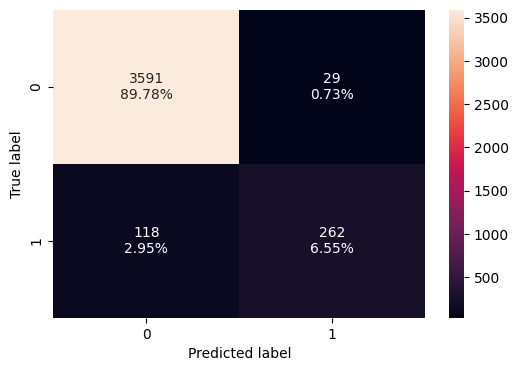

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(lg, X_train, y_train)

Checking performance on test set

In [ ]:
log_reg_model_train_perf = model_performance_classification_sklearn_with_threshold(
    lg, X_train, y_train
)

print("Training Set performance:")
log_reg_model_train_perf

Training Set performance:


,Accuracy,Recall,Precision,F1
0,0.96325,0.689474,0.900344,0.780924


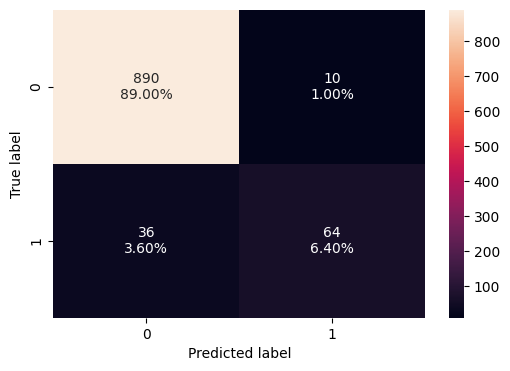

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(lg, X_test, y_test)

In [ ]:
log_reg_model_test_perf = model_performance_classification_sklearn_with_threshold(
    lg, X_test, y_test
)

print("Test set performance:")
log_reg_model_test_perf

Test set performance:


,Accuracy,Recall,Precision,F1
0,0.954,0.64,0.864865,0.735632


***Observation:***

The Recall on the training and test sets are close in value 62% and 68% respectively, yet the model performance needs to be improved as viewed from the confusion matrix as well:

Test Performance of 6.20% which is less than than 9% positive class of the dataset

### Model Performance Improvement

I will like to use 0.10 threshold is to Checking model performance on training and test data tests

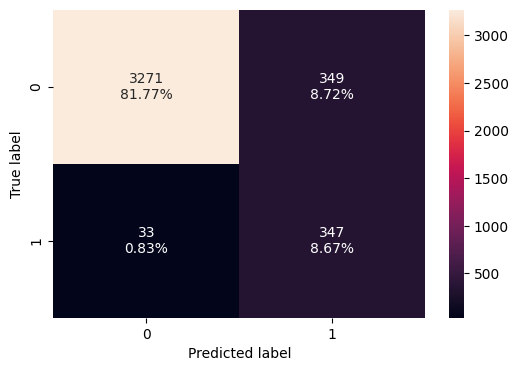

In [ ]:
# creating confusion matrix for train set
confusion_matrix_sklearn_with_threshold(
    lg, X_train, y_train, threshold=0.10
)

In [ ]:
# checking model performance for this model
log_reg_model_train_perf_threshold_curve = model_performance_classification_sklearn_with_threshold(
    lg, X_train, y_train, threshold=0.10
)
print("Training performance with deduced threshhold from Precision - Recall curve is:")
log_reg_model_train_perf_threshold_curve

Training performance with deduced threshhold from Precision - Recall curve is:


,Accuracy,Recall,Precision,F1
0,0.9045,0.913158,0.498563,0.644981


Checking model performance on test set

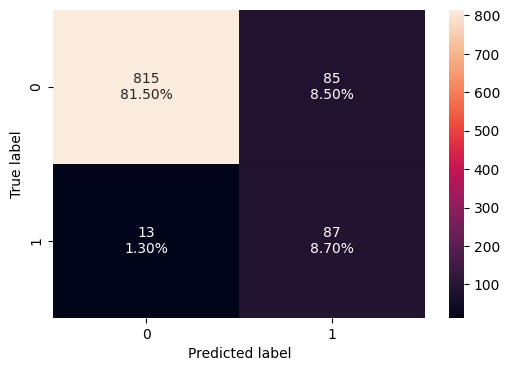

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(
    lg, X_test, y_test, threshold=0.10
)

In [ ]:
# checking model performance for this model
log_reg_model_test_perf_threshold_curve = model_performance_classification_sklearn_with_threshold(
    lg, X_test, y_test, threshold=0.10
)
print("Test performance with deduced threshhold from the Precision - Recall curve is::")
log_reg_model_test_perf_threshold_curve

Test performance with deduced threshhold from the Precision - Recall curve is::


,Accuracy,Recall,Precision,F1
0,0.902,0.87,0.505814,0.639706


Observation and conclusion:

At threshold 0.10 the Recall for the test and train data sets is equal to 87% and 91% respectively which looks good performance by the logistics regression model to minimize the FN on our model to only 1.20% on the test set while still maintaining a precision value of approximately 50% for both test and train datasets.

##Let us apply sequential feature selector

In [ ]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

# to plot the performance with addition of each feature
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [ ]:
# from sklearn.linear_model import LogisticRegression

# Fit the model on train
model = LogisticRegression(solver="newton-cg", n_jobs=-1, random_state=1, max_iter=100)

In [ ]:
X_train.shape

(4000, 257)

In [ ]:
# we will first build model with all varaible
sfs = SFS(
    model,
    k_features=257,
    forward=True,
    floating=False,
    scoring="f1",
    verbose=2,
    cv=2,
    n_jobs=-1,
)

sfs = sfs.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 257 out of 257 | elapsed:    6.7s finished

[2025-11-17 04:27:24] Features: 1/257 -- score: 0.4104808235243018[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 256 out of 256 | elapsed:    4.0s finished

[2025-11-17 04:27:28] Features: 2/257 -- score: 0.5389730931641541[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 240 out of 255 | elapsed:    3.7s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 255 out of 255 | elapsed:    4.0s finished

[2025-11-17 04:27:32] Features: 3/257 -- score: 0.5878732445359096[Parallel(n_jobs=-1)]: Using 

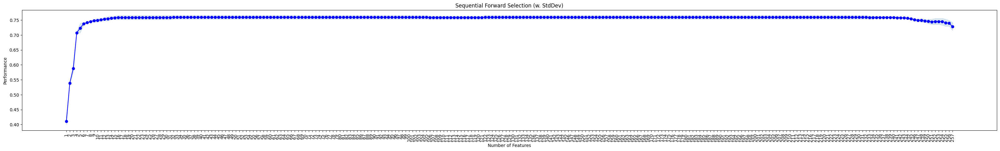

In [ ]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind="std_dev", figsize=(40, 5))

plt.title("Sequential Forward Selection (w. StdDev)")
plt.xticks(rotation=90)
plt.show()

Observation:

Its seen seen that at approx. the 18th feature, the performance start to stay constant, hence let us create a new model with 35 variables only and display the top 18 features

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 242 out of 257 | elapsed:    3.1s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 257 out of 257 | elapsed:    3.2s finished

[2025-11-17 04:44:24] Features: 1/35 -- score: 0.4104808235243018[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 256 out of 256 | elapsed:    4.0s finished

[2025-11-17 04:44:28] Features: 2/35 -- score: 0.5389730931641541[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 255 out of 255 | elapsed:    3.9s finished

[2025-11-17 04:44:32] Features: 3/35 -- score: 0.5878732445359096[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-

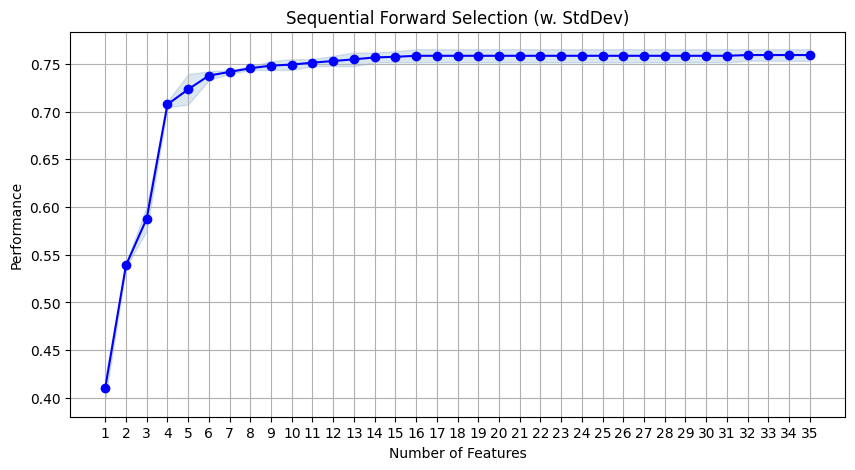

In [ ]:
sfs1 = SFS(
    model,
    k_features=35,
    forward=True,
    floating=False,
    scoring="f1",
    verbose=2,
    cv=2,
    n_jobs=-1,
)

sfs1 = sfs1.fit(X_train, y_train)

fig1 = plot_sfs(sfs1.get_metric_dict(), kind="std_dev", figsize=(10, 5))

plt.title("Sequential Forward Selection (w. StdDev)")
plt.grid()
plt.show()

More perfectly observed! Displaying the most important feature names.

##Model Performance Evaluation - Simpified model (variables = 35)

In [ ]:
feat_cols = list(sfs1.k_feature_idx_)
print(feat_cols)
X_train.columns[feat_cols]

[2, 3, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 37, 40, 42, 43, 100, 117, 119, 123, 149, 182, 206]


Index(['Income', 'Family', 'Securities_Account', 'CD_Account', 'Online',
       'CreditCard', 'Education_2', 'Education_3', 'City_Alameda',
       'City_Alamo', 'City_Albany', 'City_Alhambra', 'City_Anaheim',
       'City_Antioch', 'City_Aptos', 'City_Arcadia', 'City_Arcata',
       'City_Bakersfield', 'City_Baldwin Park', 'City_Banning',
       'City_Bella Vista', 'City_Belmont', 'City_Ben Lomond',
       'City_Beverly Hills', 'City_Camarillo', 'City_Capistrano Beach',
       'City_Cardiff By The Sea', 'City_Carlsbad', 'City_Irvine',
       'City_Los Angeles', 'City_Manhattan Beach', 'City_Menlo Park',
       'City_Oakland', 'City_Sacramento', 'City_Santa Barbara'],
      dtype='object')

In [ ]:
X_train_sfs = X_train[X_train.columns[feat_cols]]

# Creating new x_test with the same variables that we selected for x_train
X_test_sfs = X_test[X_train_sfs.columns]

# X_train_sfs = X_train.columns[X_train.columns[feat_cols]]
# X_test_sfs = X_test[X_train_sfs.columns]
print(f'''X_train shape:{X_train_sfs.shape}
Y_test shape:{X_test_sfs.shape}''')

X_train shape:(4000, 35)
Y_test shape:(1000, 35)


In [ ]:
X_train_sfs

,Income,Family,Securities_Account,CD_Account,Online,CreditCard,Education_2,Education_3,City_Alameda,City_Alamo,City_Albany,City_Alhambra,City_Anaheim,City_Antioch,City_Aptos,City_Arcadia,City_Arcata,City_Bakersfield,City_Baldwin Park,City_Banning,City_Bella Vista,City_Belmont,City_Ben Lomond,City_Beverly Hills,City_Camarillo,City_Capistrano Beach,City_Cardiff By The Sea,City_Carlsbad,City_Irvine,City_Los Angeles,City_Manhattan Beach,City_Menlo Park,City_Oakland,City_Sacramento,City_Santa Barbara
1233,22,2,0,0,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1056,25,1,0,0,1,0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1686,39,4,1,0,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
187,159,3,0,0,1,0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3840,35,3,0,0,0,0,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2895,39,4,0,0,1,0,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2763,13,4,0,0,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
905,28,1,0,0,1,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3980,89,4,0,0,1,0,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Fitting logistic regession model

log_sfs = LogisticRegression(
    solver="newton-cg", penalty=None, verbose=True, n_jobs=-1, random_state=1
)

# There are several optimizer, we are using optimizer called as 'newton-cg' with max_iter equal to 10000
# max_iter indicates number of iteration needed to converge

log_sfs.fit(X_train_sfs, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


LogisticRegression(n_jobs=-1, penalty=None, random_state=1, solver='newton-cg',
                   verbose=True)

###Model performance on training set

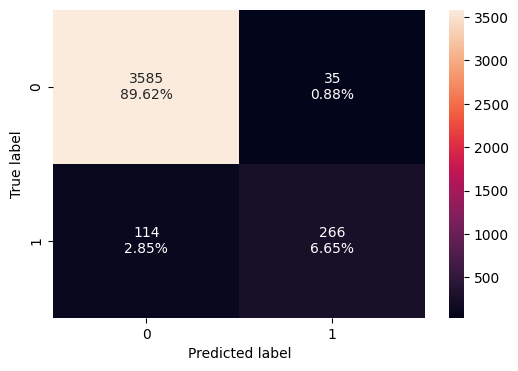

In [ ]:
confusion_matrix_sklearn_with_threshold(log_sfs, X_train_sfs, y_train)

In [ ]:
log_reg_model_train_perf_SFS = model_performance_classification_sklearn_with_threshold(
    log_sfs, X_train_sfs, y_train
)
print("Training performance:")
log_reg_model_train_perf_SFS

Training performance:


,Accuracy,Recall,Precision,F1
0,0.96275,0.7,0.883721,0.781204


###Model performance on test set

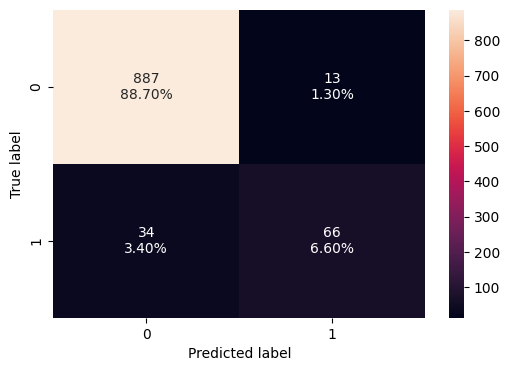

In [ ]:
confusion_matrix_sklearn_with_threshold(log_sfs, X_test_sfs, y_test)

In [ ]:
log_reg_model_test_perf_SFS = model_performance_classification_sklearn_with_threshold(
    log_sfs, X_test_sfs, y_test
)
print("Test set performance:")
log_reg_model_test_perf_SFS

Test set performance:


,Accuracy,Recall,Precision,F1
0,0.953,0.66,0.835443,0.73743


The Recall is much less than after applying the feature selection with the default threshold 0.5 , hence we will derive another model with a threshold 0.1 and observe its performance

In [ ]:
log_reg_model_train_perf_SFS_tre = model_performance_classification_sklearn_with_threshold(
    log_sfs, X_train_sfs, y_train,  threshold=0.1
)
print("Training performance:")
log_reg_model_train_perf_SFS_tre

Training performance:


,Accuracy,Recall,Precision,F1
0,0.9035,0.889474,0.495601,0.636535


In [ ]:
log_reg_model_test_perf_SFS_tre = model_performance_classification_sklearn_with_threshold(
    log_sfs, X_test_sfs, y_test, threshold=0.1
)

print("Test set performance:")
log_reg_model_test_perf_SFS_tre

Test set performance:


,Accuracy,Recall,Precision,F1
0,0.895,0.84,0.485549,0.615385


***The Recall of the train and test sets are highly mismatched, where recall train = 0.8894 and recall test = 0.64***

Logistic Regression Models Comparison:

Sr  Model name    Train_performance         recall(train).  Test_performance.        recall(test).  Threshold   Var

1. Model name -lg. Recall(train) 0.6894. Recall(test) 0.6500. Threshold - 0.50 No of Variables - 257

2. Model name -lg  Recall(train) 0.9131  Recall(test) 0.8700  Threshold - 0.10 No of Variables - 257

3. Model name -log_sfs  Recall(train) 0.7052 Recall(test) 0.6400  Threshold - 0.50 No of Variables - 18

4. Model name -log_sfs	Recall(train) 0.8894 Recall(test) 0.6400  Threshold - 0.10 No of Variables - 18


Observation:
The best performing model is ***Model_2*** lg model tuned to a threshold of 0.10 and uses 257 variables

Conclusion:

1. Low threshold yields a good model predictibility and its explained by the low percentage of class 1 customers (who accept personal loan) in the original data set.

This model will be used in the final comparison between Decision tree models

#Model Building
##2. Decision Tree

In addition to using: get_recall_score and make_confusion_matrix functions, we will define the function plot_tree to plot the decision trees for the models under study

In [ ]:
#function to plot a decision tree
def plot_tree(model, Predictor):
    feature_names = Predictor.columns.to_list()
    plt.figure(figsize=(20, 30))
    out = tree.plot_tree(
        model,
        feature_names=feature_names,
        filled=True,
        fontsize=9,
        node_ids=False,
        class_names=None,
    )
    # below code will add arrows to the decision tree split if they are missing
    for o in out:
        arrow = o.arrow_patch
        if arrow is not None:
            arrow.set_edgecolor("black")
            arrow.set_linewidth(1)
    plt.show()

***Building the original tree T_o***

The starting point is building the original full tree model with the default hyperparameters and observe:

Model performance

Variables importance

Model Improvement strategy

Yet, It was noted that the frequence of classes in training set is:

Class	Frequence

0 -	0.905429

1 -	0.094571

In [ ]:
#creating the decission tree model
t_0 = DecisionTreeClassifier(criterion="gini", class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

In [ ]:
#fitting the training data
t_0.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

***Model performance Evaluation of T_o***

In [ ]:
#Calculating the Recall for train and test data
Recall_Train_T_0 = get_recall_score(t_0, X_train, y_train)
print(f'Recall for T_0 on Train Data = {Recall_Train_T_0}')
Recall_Test_T_0 = get_recall_score(t_0, X_test, y_test)
print(f'Recall for T_0 on Test Data = {Recall_Test_T_0}')

Recall for T_0 on Train Data = 1.0
Recall for T_0 on Test Data = 0.85


Mismatch is observed between train and test sets performance, it is assumed that the T_0 model is overfitting the data. let us observe further the confusion matrix and the tree structure.

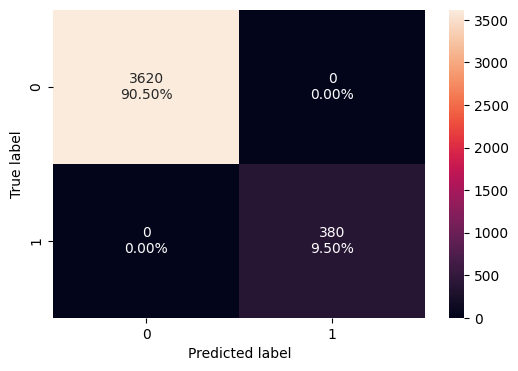

In [ ]:
confusion_matrix_sklearn(t_0, X_train, y_train)

As assumed, the model is perfectly overfitting the data as observed from the confusion matric the FN & FP are 0%

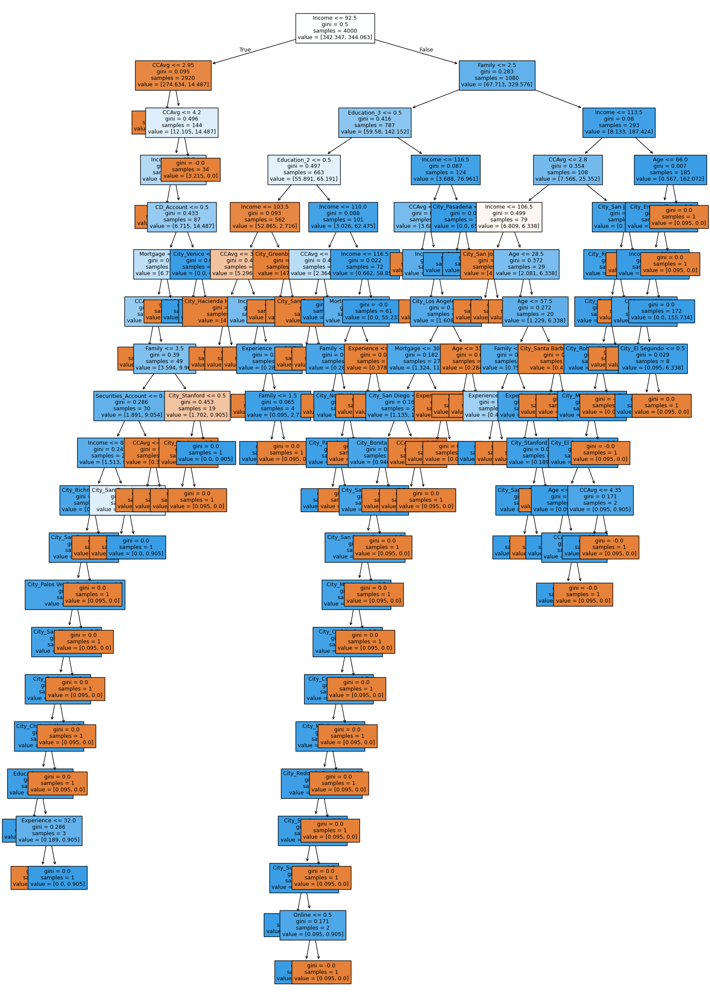

In [ ]:
#plotting the tree
plot_tree(t_0,X_train)

***Observation***

The original tree T_o is seen to be complicated and is overfitting into the training data set, pre-prunning and post pruning are to be considered to improve the model performance.

The first split on the T_o was on the "Income" variable, let us observe first how this variable importances look like

In [ ]:
# importance of features in the tree building (The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

def view_nd_plot_importance(model, predictors):
    print("The features importances:")
    print(
        pd.DataFrame(
            model.feature_importances_, columns=["Imp"], index=predictors.columns
        ).sort_values(by="Imp", ascending=False)
    )

    importances = model.feature_importances_
    indices = np.argsort(importances)

    plt.figure(figsize=(12, 65))
    plt.title("Feature Importances")
    plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
    plt.yticks(range(len(indices)), [predictors.columns[i] for i in indices])
    plt.xlabel("Relative Importance")
    plt.show()

The features importances:
                          Imp
Income               0.635549
Education_2          0.143484
CCAvg                0.085613
Education_3          0.048952
Family               0.041663
...                       ...
City_Torrance        0.000000
City_Trinity Center  0.000000
City_Tustin          0.000000
City_Ukiah           0.000000
State_CA             0.000000

[257 rows x 1 columns]


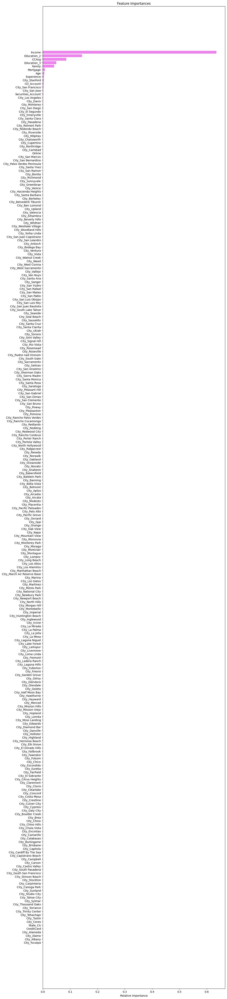

In [ ]:
view_nd_plot_importance(t_0, X_train)

It is observed that the top importance variable is Income and the least importance are the cities (except for Los Angles that contributes slightly to the model predictibility)
The top 5 variables are :

Income

Education_2

CCAvg

Education_3

Family

#Model performance improvement
##1. Pre-prunning

In [ ]:
#let us get the max depth of T_0 to have an idea how to tune our parameters
print(f'''The max depth of the t_0 =  {t_0.tree_.max_depth}
The node_count ={t_0.tree_.node_count}
The number of leaves = {t_0.tree_.n_leaves}''')

The max depth of the t_0 =  20
The node_count =179
The number of leaves = 90


In [ ]:
# Choose the type of classifier.
t_grid = DecisionTreeClassifier(random_state=1, class_weight={0: 0.094571, 1: 0.905429})

# Grid of parameters to choose from
parameters = {
    "max_depth": [5, 10, 15, 20, None],
    "criterion": ["entropy", "gini"],
    "splitter": ["best", "random"],
    'min_samples_leaf': [1, 2, 5, 7, 10,15,20],
    'max_leaf_nodes' : [2, 3, 5, 10],
    "min_impurity_decrease": [0.00001, 0.0001, 0.01],
}

# Type of scoring used to compare parameter combinations
scorer = make_scorer(recall_score)

# Run the grid search
grid_obj = GridSearchCV(t_grid, parameters, scoring=scorer, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
t_grid = grid_obj.best_estimator_

# Fit the best algorithm to the data.
t_grid.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.094571, 1: 0.905429},
                       criterion='entropy', max_depth=5, max_leaf_nodes=3,
                       min_impurity_decrease=1e-05, random_state=1)

Model Performance Evaluation_Pre-pruned Tree T_1

In [ ]:
# Choose the type of classifier.
t_1 = DecisionTreeClassifier(random_state=1,max_depth=5, criterion='entropy'
                             , class_weight={0: 0.094571, 1: 0.905429})

In [ ]:
t_1.fit(X_train,y_train)

DecisionTreeClassifier(class_weight={0: 0.094571, 1: 0.905429},
                       criterion='entropy', max_depth=5, random_state=1)

Model Performance Evaluation_Pre-pruned Tree T_1

In [ ]:
Recall_Train_T_1 = get_recall_score(t_1, X_train, y_train)
print(f'Recall for T_1 on Train Data = {Recall_Train_T_1}')
Recall_Test_T_1 = get_recall_score(t_1, X_test, y_test)
print(f'Recall for T_1 on Test Data = {Recall_Test_T_1}')

Recall for T_1 on Train Data = 0.9921052631578947
Recall for T_1 on Test Data = 0.92


Displaying the tree, the confucion matrix and variables importance

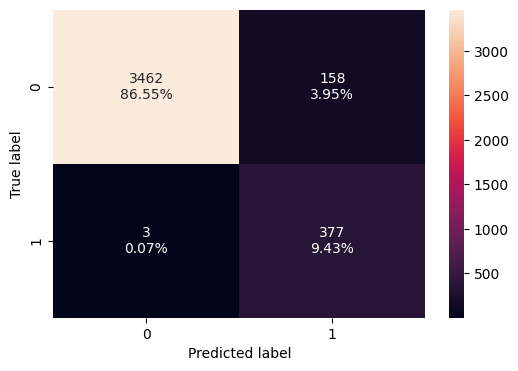

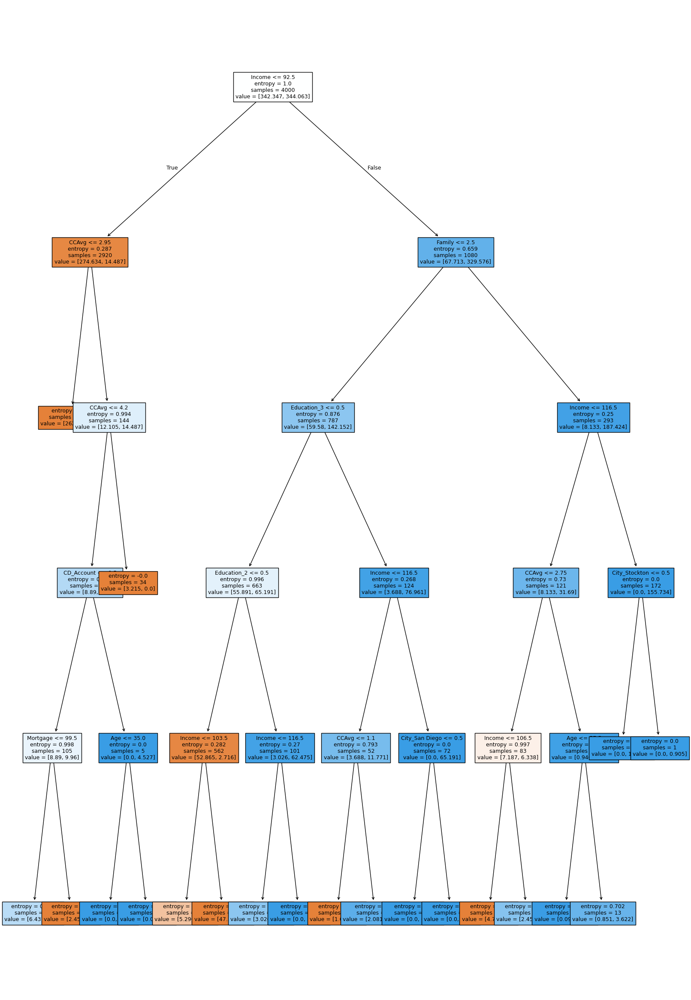

The features importances:
                         Imp
Income              0.620903
Education_2         0.137543
CCAvg               0.116768
Family              0.057203
Education_3         0.054307
...                      ...
City_Hermosa Beach  0.000000
City_Highland       0.000000
City_Hollister      0.000000
City_Hopland        0.000000
City_Fresno         0.000000

[257 rows x 1 columns]


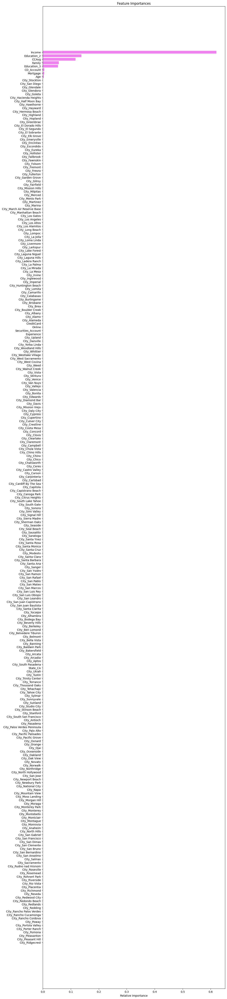

In [ ]:
confusion_matrix_sklearn(t_1, X_train, y_train)
plot_tree(t_1,X_train)
view_nd_plot_importance(t_1, X_train)

Observation

At max_depth=5. criterion= entropy and default values for the remaining hyperparameters the model performance on the test set is better than at
 at max_depth= None criterion = gini

Recall values:
Recall for T_1 on Train Data = 0.9921052631578947

Recall for T_1 on Test Data = 0.92000000000000000

Features with max importance:
Income 6.20903e-01

Education_2 1.37543-01

Less importance yet still having a predictibily effect:
CCAvg 1.16768-01

Family 5.7203e-02

Education_3 5.4307-02

Confusion matrix: -

FN at 0.07% -

FP at 3.95%

***Tuning further hyperparameters to derive model T_2***

In [ ]:
#Choose the type of classifier.
t_2 = DecisionTreeClassifier(random_state=1,max_depth=5, criterion='entropy'
                             , class_weight={0: 0.094571, 1: 0.905429},max_leaf_nodes=3,
                       min_impurity_decrease=1e-05)

In [ ]:
t_2.fit(X_train,y_train)

DecisionTreeClassifier(class_weight={0: 0.094571, 1: 0.905429},
                       criterion='entropy', max_depth=5, max_leaf_nodes=3,
                       min_impurity_decrease=1e-05, random_state=1)

Model Performance Evaluation_Pre-pruned Tree T_2

In [ ]:
Recall_Train_T_2 = get_recall_score(t_2, X_train, y_train)
print(f'Recall for T_2 on Train Data = {Recall_Train_T_1}')
Recall_Test_T_1 = get_recall_score(t_2, X_test, y_test)
print(f'Recall for T_2 on Test Data = {Recall_Test_T_1}')

Recall for T_2 on Train Data = 0.9921052631578947
Recall for T_2 on Test Data = 1.0


The feature importance of this model is:

Features with max importance:

Income 6.221524e-01

Education_2 1.290525e-01

Less importance yet still having a predictibily effect:

CCAvg 1.221962e-01

Family 5.805141e-02

Education_3 5.305620e-02

##Post Prunning

In [ ]:
#defining the classifier
PP_t_0 = DecisionTreeClassifier(random_state=1, class_weight={0: 0.094571, 1: 0.905429})

#defining the cost complexity pryning path
path = PP_t_0.cost_complexity_pruning_path(X_train, y_train)

#Extracting the ccp_aplhas and impurities from the path
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [ ]:
#displaying the ccp_alphas VS the impurities to prove that as the alphase increas the impurities increase
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.000000e+00,-1.221160e-14
1,1.346069e-18,-1.221025e-14
2,1.346069e-18,-1.220891e-14
3,1.927326e-18,-1.220698e-14
4,2.141473e-18,-1.220484e-14
5,2.692138e-18,-1.220215e-14
6,3.212210e-18,-1.219894e-14
7,4.129984e-18,-1.219481e-14
8,7.648118e-18,-1.218716e-14
9,7.648118e-18,-1.217951e-14


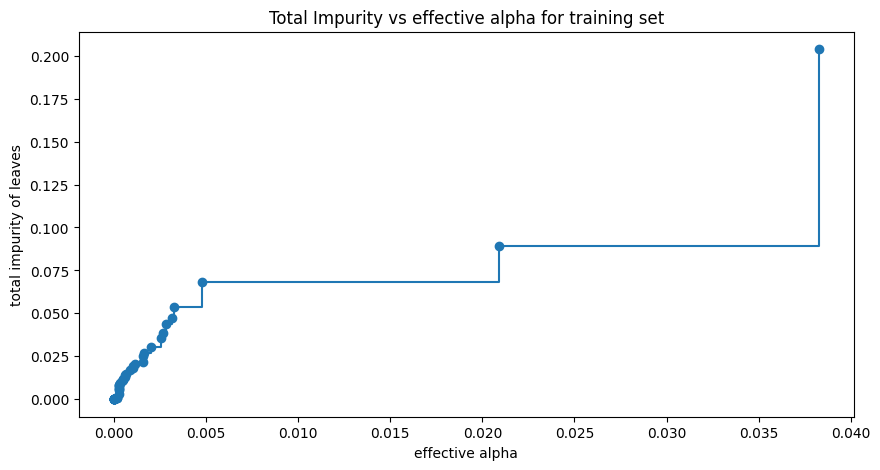

In [ ]:
#let us plot the alphas VS the impurities
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

***Observation:***

1. It is observed that the impurities show a sdeen peak after alpha = approx.0.005

2. Now train the decision tree using the effective alphas and observe how the tree depth vary with alpha

In [ ]:
#an emplty list of post pruned trees (PP_trees)

PP_trees = []
for alpha in ccp_alphas:
    PP_tree = DecisionTreeClassifier(
        random_state=1, ccp_alpha=alpha, class_weight={0: 0.094571, 1: 0.905429}
    )
    PP_tree.fit(X_train, y_train)
    PP_trees.append(PP_tree)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        PP_trees[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.2962323013249329


Action:

Remove the last elements in PP_trees and CCP_alphas as they relfect the smallest tree (one node) and proceed with the visualtization of the nodes and depth (i.e tree complexity) as alpha varies

In [ ]:
PP_trees = PP_trees[:-1]
ccp_alphas = ccp_alphas[:-1]

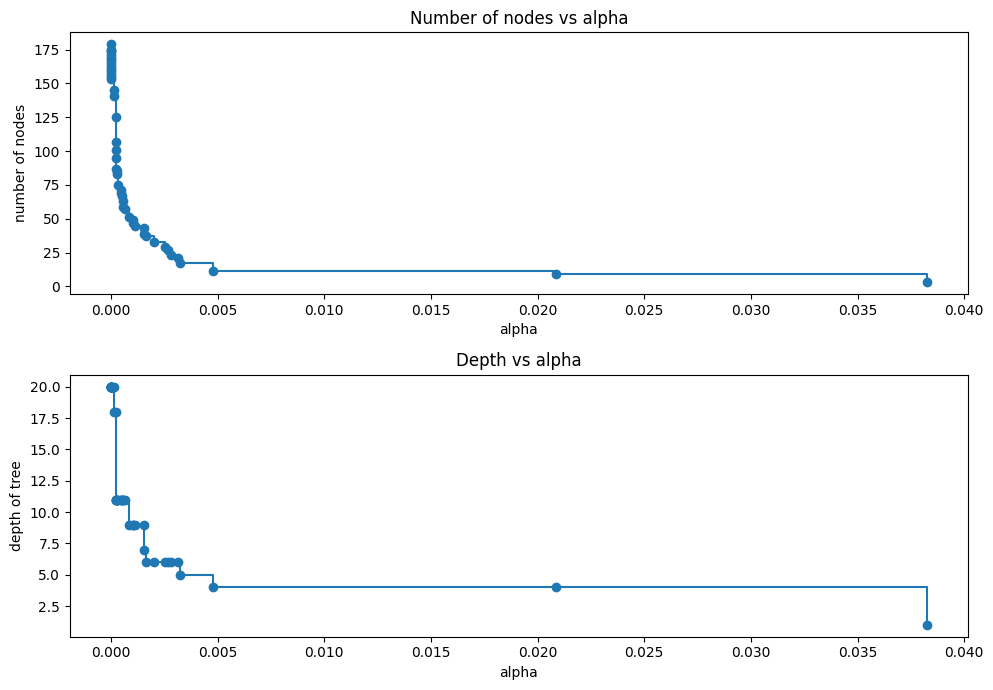

In [ ]:
node_counts = [PP_tree.tree_.node_count for PP_tree in PP_trees]
depth = [PP_tree.tree_.max_depth for PP_tree in PP_trees]
fig, ax = plt.subplots(2, 1, figsize=(10, 7))
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

***Observation**

1. At alpha = 0.005, the tree have reached the smallest size which is underfitting the data.

2. We now have an idea that the alpha value that will give us the optimum model performance is below 0.05

3. Observe how the Model recall values will vary based on varying alphas for the training and test sets

In [ ]:
#derive the recall values for all PP_tress for the train set
recall_train = []
for PP_tree in PP_trees:
    y_pred_train = PP_tree.predict(X_train)
    values_train = recall_score(y_train, y_pred_train)
    recall_train.append(values_train)

In [ ]:
#derive the recall values for all PP_tress for the test set
recall_test = []
for PP_tree in PP_trees:
    y_pred_test = PP_tree.predict(X_test)
    values_test = recall_score(y_test, y_pred_test)
    recall_test.append(values_test)

In [ ]:
#calculating the Accuracy of test and train models
train_scores = [PP_tree.score(X_train, y_train) for PP_tree in PP_trees]
test_scores = [PP_tree.score(X_test, y_test) for PP_tree in PP_trees]

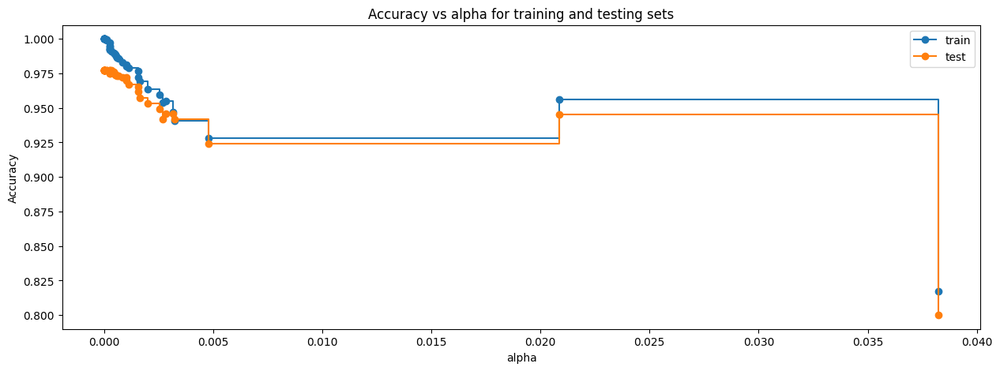

In [ ]:
#plotting the accuracy for test and training sets
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("Accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(
    ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post",
)
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

***Observation***

1. Observation better performance at alpha less than 0.05

2. The alpha is giving the best value close to zero which could be still reflecting an over fitting tree

3. The other option is at approx 0.03 or 0.035. Still, the accuracy is not the optimum performance measurement we need, so we must find the best Recall value as a performance measurement

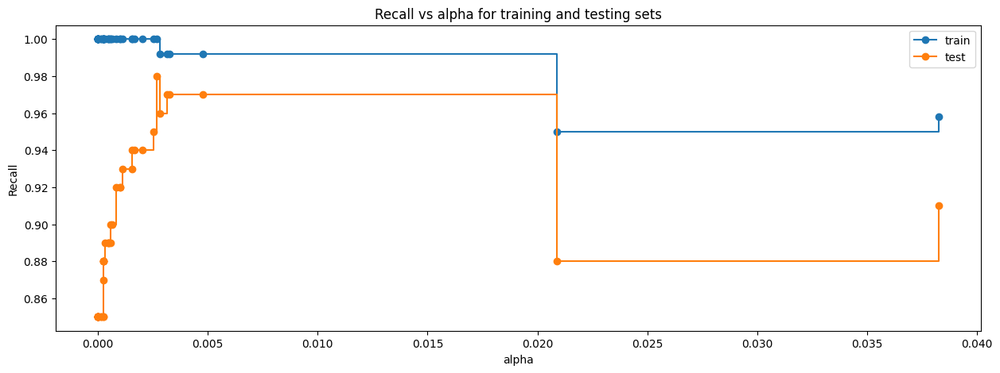

In [ ]:
#plotting the recall scores for test and training sets VS Alpha
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(
    ccp_alphas, recall_train, marker="o", label="train", drawstyle="steps-post",
)
ax.plot(ccp_alphas, recall_test, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
#let us derive the minimum alpha value for the test test
index_best_model = np.argmax(recall_test)
print(f''' The recall value giving the best predictibility model is: {recall_test[index_best_model]}
"The best alpha value is: {ccp_alphas[index_best_model]}"''')

 The recall value giving the best predictibility model is: 0.98
"The best alpha value is: 0.002683713283947349"


Deriving the best model PP_t_best and fitting it to the train set

In [ ]:
PP_t_best_1 = PP_trees[index_best_model]
PP_t_best_1.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=np.float64(0.002683713283947349),
                       class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

##Model Performance Evaluation_Post-pruned Tree

In [ ]:
#Calculating the Recall for train and test data
Recall_Train_PP_t_best_1 = get_recall_score(PP_t_best_1, X_train, y_train)
print(f'Recall for PP_t_best_1 on Train Data = {Recall_Train_PP_t_best_1}')

Recall_Test_PP_t_best_1 = get_recall_score(PP_t_best_1, X_test, y_test)
print(f'Recall for PP_t_best_1 on Test Data = {Recall_Test_PP_t_best_1}')

Recall for PP_t_best_1 on Train Data = 1.0
Recall for PP_t_best_1 on Test Data = 0.98


***Observation***

1. The Recall on train data sets is 1.0

2. Since its value is closer to the recall of the test dataset which is still better than t_0

3. It would require further improvement

4. Derive the tree, decision table and feature importantce for this model PP_t_best_1

5. Then derive another model of the second peak of alpha.

The tree depth is : 6


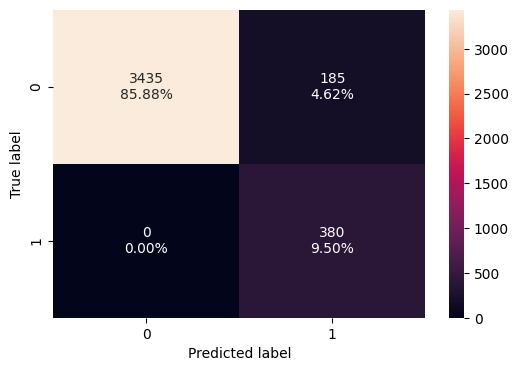

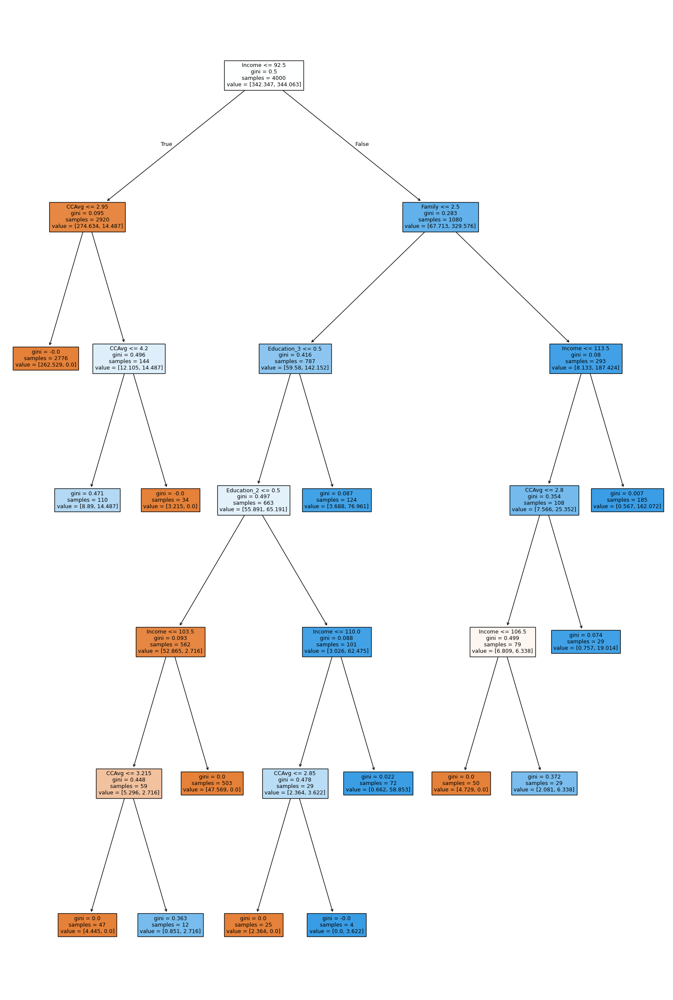

The features importances:
                        Imp
Income             0.671525
Education_2        0.155432
CCAvg              0.079833
Education_3        0.052849
Family             0.040362
...                     ...
City_Garden Grove  0.000000
City_Fullerton     0.000000
City_Fresno        0.000000
City_Fremont       0.000000
City_Greenbrae     0.000000

[257 rows x 1 columns]


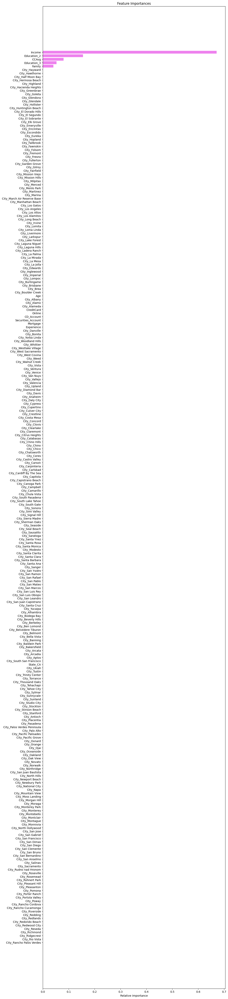

In [ ]:
#plotting the tree, variables importance and the confusion matrix
print(f'The tree depth is : {PP_t_best_1.tree_.max_depth}')
confusion_matrix_sklearn(PP_t_best_1, X_train, y_train)
plot_tree(PP_t_best_1,X_train)
view_nd_plot_importance(PP_t_best_1, X_train)

***Observation on PP_t_best_1 Model***

1. At ccp_alpha=0.002683713283947349 and max_depth=6 the performance summary is:

a. Recall values:

i. Recall for PP_t_best_1 on Train Data = 1.0

ii. Recall for PP_t_best_1 on Test Data = 0.98

b. Features with max importance: (a) Income (b) Education_2

i. Less importance yet still having a predictibily effect: (a) CCAvg (b) Education_3 (c)Family

c. Confusion matrix:

i. FN at 0.00%

ii. FP at 4.62%

In [ ]:
#creating a data frame including alpha, recall train and recall test
df = pd.DataFrame()
df[['ccp_alphas', 'recall_train', 'recall_test']]=''
df['ccp_alphas']=ccp_alphas
df['recall_train']= recall_train
df['recall_test']=recall_test
df

,ccp_alphas,recall_train,recall_test
0,0.000000e+00,1.000000,0.85
1,1.346069e-18,1.000000,0.85
2,1.346069e-18,1.000000,0.85
3,1.927326e-18,1.000000,0.85
4,2.141473e-18,1.000000,0.85
5,2.692138e-18,1.000000,0.85
6,3.212210e-18,1.000000,0.85
7,4.129984e-18,1.000000,0.85
8,7.648118e-18,1.000000,0.85
9,7.648118e-18,1.000000,0.85


At row 42 above, it is observed that recall values for train and test  at a value of alpha near the 0.003 threshold we had seen earlier on the curve.

This value seems a good fit as it is not too close to an underfitting model, hence we will extract this value and observe how it behaves on the tree and confusion matrix

In [ ]:
df.iloc[42]

,42
ccp_alphas,0.003251
recall_train,0.992105
recall_test,0.970000


In [ ]:
#extracting the model from the 42nd model and fitting it to train and test data
PP_t_best_2 = PP_trees[42]
PP_t_best_2.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=np.float64(0.003251436542468189),
                       class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

##Model Performance Evaluation of Post-pruned Tree PP_t_best_2

In [ ]:
#Calculating the Recall for train and test data
Recall_Train_PP_t_best_2 = get_recall_score(PP_t_best_2, X_train, y_train)
print(f'Recall for PP_t_best_2 on Train Data = {Recall_Train_PP_t_best_2}')

Recall_Test_PP_t_best_2 = get_recall_score(PP_t_best_2, X_test, y_test)
print(f'Recall for PP_t_best_2 on Test Data = {get_recall_score(PP_t_best_2, X_test, y_test)}')

Recall for PP_t_best_2 on Train Data = 0.9921052631578947
Recall for PP_t_best_2 on Test Data = 0.97


***Observation***

1. The Recall on test and train data sets are almost the same as stated in the dataframe ***which was expected***

2. Now visualizing the tree, the confusion matrix and feature importance

The tree depth is : 5


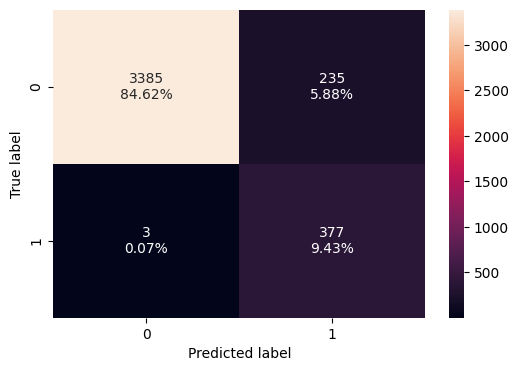

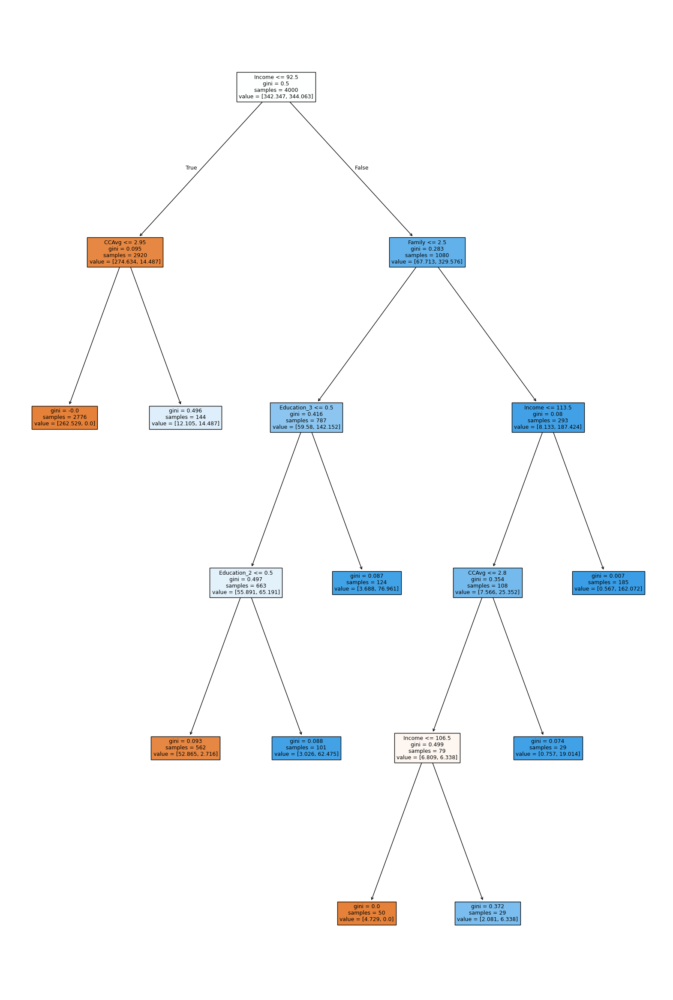

The features importances:
                        Imp
Income             0.684178
Education_2        0.160763
CCAvg              0.058652
Education_3        0.054661
Family             0.041746
...                     ...
City_Garden Grove  0.000000
City_Fullerton     0.000000
City_Fresno        0.000000
City_Fremont       0.000000
City_Greenbrae     0.000000

[257 rows x 1 columns]


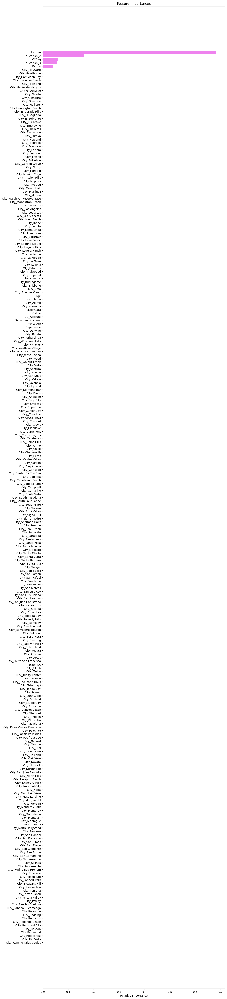

In [ ]:
#plotting the tree, variables importance and the confusion matrix
print(f'The tree depth is : {PP_t_best_2.tree_.max_depth}')
confusion_matrix_sklearn(PP_t_best_2, X_train, y_train)
plot_tree(PP_t_best_2,X_train)
view_nd_plot_importance(PP_t_best_2, X_train)

***Observation on PP_t_best_2 Model***

1. At ccp_alpha=0.003504 and max_depth=6 the performance of PP_t_best_2 is better then PP_t_best_1. Although the recall values for train and test are less, the FN% in the confusion matrix is down to half. The performance summary is:

a. Recall values:

i. Recall for PP_t_best_2 on Train Data = 0.9921052631578947

ii. Recall for PP_t_best_2 on Test Data = 0.97

b. Features with max importance:

i. Income 0.684178

ii. Education_2 0.160763

c. Less importance yet still having a predictibily effect:

i. CCAvg 0.058652

ii. Education_3 0.054661

iii. Family 0.041746

Confusion matrix:

FN at 0.07%

FP at 5.88%

##Model Performance Evaluation_Post-pruned Tree PP_t_best_3

In [ ]:
df.iloc[42]

,42
ccp_alphas,0.003251
recall_train,0.992105
recall_test,0.970000


In [ ]:
#extracting the model from the 42nd model and fitting it to train and test data
PP_t_best_3 = PP_trees[42]
PP_t_best_3.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=np.float64(0.003251436542468189),
                       class_weight={0: 0.094571, 1: 0.905429}, random_state=1)

In [ ]:
#Calculating the Recall for train and test data
Recall_Train_PP_t_best_3 = get_recall_score(PP_t_best_3, X_train, y_train)
print(f'Recall for PP_t_best_3 on Train Data = {Recall_Train_PP_t_best_3}')
Recall_Test_PP_t_best_3 = get_recall_score(PP_t_best_3, X_test, y_test)
print(f'Recall for PP_t_best_3 on Test Data = {Recall_Test_PP_t_best_3}')

Recall for PP_t_best_3 on Train Data = 0.9921052631578947
Recall for PP_t_best_3 on Test Data = 0.97


The Recall on test and train data sets are looks good

Visualizing the tree, the confusion matrix and feature importance

The tree depth is : 5


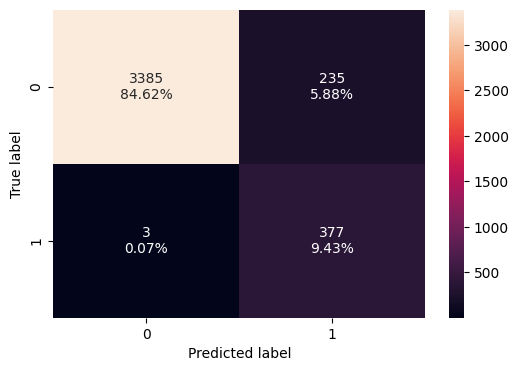

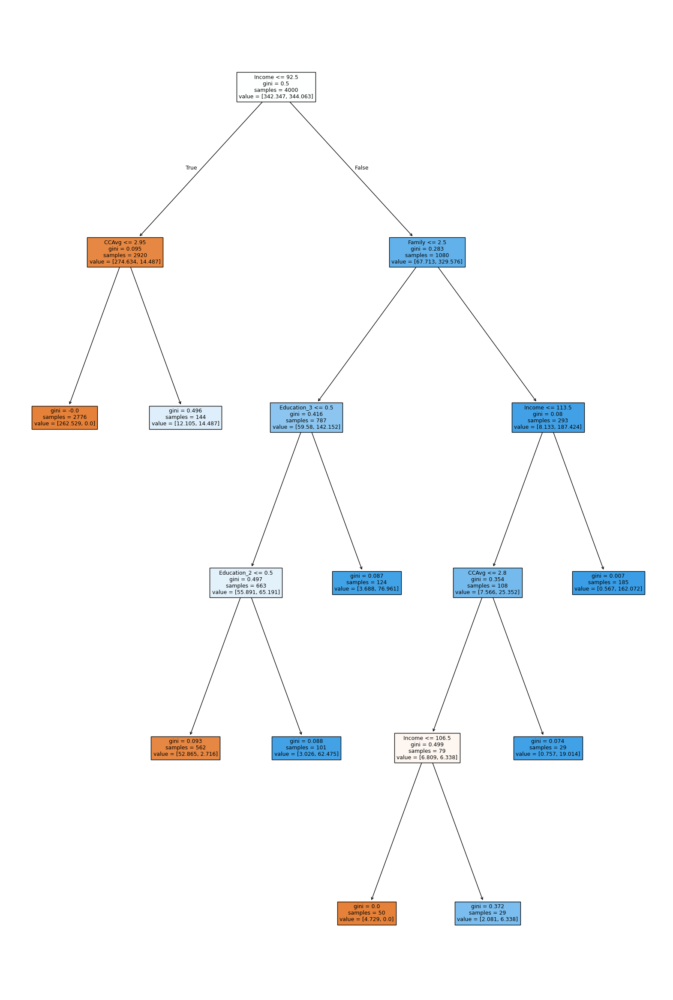

The features importances:
                        Imp
Income             0.684178
Education_2        0.160763
CCAvg              0.058652
Education_3        0.054661
Family             0.041746
...                     ...
City_Garden Grove  0.000000
City_Fullerton     0.000000
City_Fresno        0.000000
City_Fremont       0.000000
City_Greenbrae     0.000000

[257 rows x 1 columns]


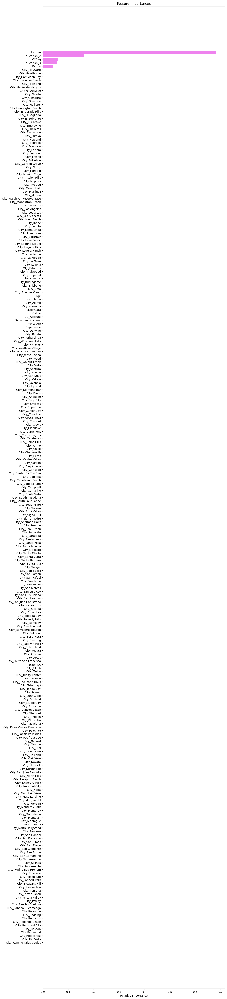

In [ ]:
#plotting the tree, variables importance and the confusion matrix
print(f'The tree depth is : {PP_t_best_3.tree_.max_depth}')
confusion_matrix_sklearn(PP_t_best_3, X_train, y_train)
plot_tree(PP_t_best_3,X_train)
view_nd_plot_importance(PP_t_best_3, X_train)

***Observation on PP_t_best_3 Model***

At ccp_alpha=0.003251 max_depth=5 the performance of PP_t_best_3 is better then PP_t_best_2.

The performance summary is:

Recall values:

Recall for PP_t_best_3 on Train Data = 0.9921052631578947

Recall for PP_t_best_3 on Test Data = 0.97

Features with max importance:

Income 0.684178

Education_2 0.160763

Less importance yet still having a predictibily effect:

CCAvg 0.058652

Education_3 0.054661

Family 0.041746

Confusion matrix:

FN at 0.07%

FP at 5.88%

***Decision Tree Conclusion***

1. The third and final model has a low tree depth of 5, hence less tree complexity of the tree using a greater value of alpha and it was successful in avoiding the model overfitting. Hence, The best performing model on the test set is PP_t_best_3 with the below alpha value

At ccp_alpha=0.003251 max_depth=5 the performance of PP_t_best_3 is better then PP_t_best_2.

The performance summary is:

Recall values:

Recall for PP_t_best_3 on Train Data = 0.9921052631578947

Recall for PP_t_best_3 on Test Data = 0.97

Features with max importance:

Income 0.684178

Education_2 0.160763

Less importance yet still having a predictibily effect:

CCAvg 0.058652

Education_3 0.054661

Family 0.041746

Confusion matrix:

FN at 0.07%

FP at 5.88%

## Model Comparison and Final Model Selection

Observation and conclusion:

At threshold 0.10 the Recall for the test and train data sets is equal to 87% and 91% respectively which is a very good performance by the logistics regression model to minimize the FN on our model to only 1.20% on the test set whilst maintaing a precision value of approximately 50% for both test and train datasets.

## Actionable Insights and Business Recommendations


Final models comparison:

Modelling Algorithm	Model Name

recall (train)

recall (test)


Logistic Regression

lg with threshold 0.1	0.92	0.88

Decision Tree

(Pre Pruned)	t_1	0.99	0.95

(Post Pruned)	PP_t_best_3	0.99	0.97

Insights:

The best performing model was derived from the ***Decision Tree Modelling technique*** where the original tree was post pruned via ccp_alpha=0.0.003251 and gave the below Recall values for test and training data sets:

Recall for PP_t_best_3 on Train Data = 0.9921052631578947 and Recall for PP_t_best_3 on Test Data = 0.97

The statistical evidence show the Features that most affects the client decision to accept a personal loan are listed in below table with priority levels;

Priority	Feature	Effect on customer
1.	***Income-*** The higher the income, the more chances are that the customer will accept a personal loan

2.	***Education_2-*** Customers with Education level 2 are more willing to accept a personal loan than levels 1 and 3

3.	***CCAvg-*** As the average monthly spending of customers increases, the more the customers are are willing to accept personal loan

4.	***Education_3-***	Customers with Education level 3 are more willing to accept a personal loan than level 1

5.	***Family-*** As familly size grows, customers are more willing to accept personal loan

##What recommedations would you suggest to the bank?

1. The marketing department should study customers profiles first before approaching them for a personal loan offer.

2. AllLife bank should apply various strategies to sell more Personal Loan packages especially by using dedicated relationship managers for high profile customers

3. The bank should also consider monthly/quarterly follow-up with average to mid profile customers in order to see how to attract more customers to take personal loan

4. The bank should consider doing a rigorous mail marketting directed to high and mid profile customers so that they will be properly informed about getting pre-approved for personal loans

5. Income is also seen at the most important feature in decision tree model. So If our customer's yearly income is less than USD92,500, its most likely the customer wouldn't accept a personal loan

6. Consequently, customers with an income greater than USD92,500 and with an education level greater than or equal to 3 (Advanced/Professional) were most likely to have a personal loan. So a targetted marketting to this group is very important.

7. Finally, customers using online banking services were more likely to have personal loans. Therefore, the bank should improve on the websites and make it more user-friendly and encourage those customers who don't use the facilities to use the online banking services

8. Making personal loan application process on the website available on mobile device and reducing online applications to few clicks would be helpful in order to improve customers' user experience when applying for personal loan.

9. The location of residence of customers does not really have any real impact on their decision whether to accept personal loans or not as long as the the bank can do the things mentioned in points 1-8 above.

In [ ]:
!pip install nbconvert

In [165]:
%%shell
jupyter nbconvert --to html '/content/drive/My Drive/UTA - AIML/Machine_Learning_SL_Full_Code_Akomolafe_Samson_updated_a.ipynb'

[NbConvertApp] Converting notebook /content/drive/My Drive/UTA - AIML/Machine_Learning_SL_Full_Code_Akomolafe_Samson_updated_a.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 58 image(s).
[NbConvertApp] Writing 11681893 bytes to /content/drive/My Drive/UTA - AIML/Machine_Learning_SL_Full_Code_Akomolafe_Samson_updated_a.html


___